# Progetto Visualizzazione Scientifica - Accessibilità nelle scuole

### import librerie

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.text import Text
import matplotlib.patches as mpatches
import geopandas as gpd
import mapclassify as mc
import folium
from shapely.geometry import Polygon, Point
import matplotlib.colors as mcolors

data_dir = "./dataset/"
img_dir = "./img/"

### Colormap

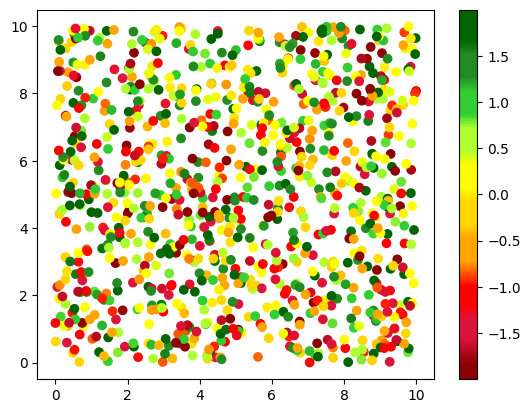

In [2]:
def make_colormap(seq):
    seq = [(None,) * 3, 0.0] + list(seq) + [1.0, (None,) * 3]
    cdict = {'red': [], 'green': [], 'blue': []}
    for i, item in enumerate(seq):
        if isinstance(item, float):
            r1, g1, b1 = seq[i - 1]
            r2, g2, b2 = seq[i + 1]
            cdict['red'].append([item, r1, r2])
            cdict['green'].append([item, g1, g2])
            cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)


c = mcolors.ColorConverter().to_rgb
cm = make_colormap(
    [c('darkred'), 0.04, c('darkred'), c('crimson'), 0.11, c('crimson'), 0.16, c('crimson'), c('r'), 0.20, c('r'), 0.25, c('r'),
c('orange'), 0.32, c('orange'), 0.38, c('orange'), c('gold'), 0.42, c('gold'), 0.48, c('gold'), c('yellow'), 0.52,
c('yellow'), 0.58, c('yellow'), c('greenyellow'), 0.62, c('greenyellow'), 0.68, c('greenyellow'), c('limegreen'), 0.72,
c('limegreen'), 0.78, c('limegreen'), c('forestgreen'), 0.82, c('forestgreen'), 0.88,c('forestgreen'), c('darkgreen'), 0.92, c('darkgreen')])

cm2 = make_colormap(
    [c('darkred'), 0.1, c('crimson'), 0.2, c('r'), 0.3, c('orange'), 0.4, c('gold'), 0.5, c('yellow'), 0.6, 
     c('greenyellow'), 0.7, c('limegreen'), 0.8, c('forestgreen'), 0.9, c('darkgreen')])
N = 1000
array_dg = np.random.uniform(0, 10, size=(N, 2))
colors = np.random.uniform(-2, 2, size=(N,))
plt.scatter(array_dg[:, 0], array_dg[:, 1], c=colors, cmap=cm)
plt.colorbar()
plt.show()


cm_interattiva = make_colormap(
    [c('darkred'), 0.12, c('darkred'), c('crimson'), 0.18, c('crimson'), 0.30, c('crimson'), c('r'), 0.36, c('r'), 0.48, c('r'),
c('orange'), 0.54, c('orange'), 0.66, c('orange'), c('gold'), 0.72, c('gold'), 0.84, c('gold'), c('yellow'), 0.90,
c('yellow')])

## Funzioni utili ( private )

In [3]:
# Funzione che modifica i nomi delle colonne di "da_modificare" con i nomi delle corrispondenti colonne di "base"
def make_consistent(base, da_modificare):
    for i in range(min(base.columns.size, da_modificare.columns.size)):
        # check if columns name are equal
        if(base.columns[i] != da_modificare.columns[i]):
            # rename column
            da_modificare.rename(columns = {da_modificare.columns[i]:base.columns[i]}, inplace=True)

# Funzione che verifica che due dataset abbiano lo stesso numero di colonne e con gli stessi nomi 
def check_same_shape(a, b):
    size = min(a.columns.size, b.columns.size)
    return np.all(a.columns[:size] == b.columns[:size])

def get_province_by_region(regione, elenco_province):
    return elenco_province[elenco_province.regione == regione].sigla.to_numpy()
def get_scuole_by_province(province, elenco_scuole):
    return elenco_scuole[elenco_scuole.SIGLAPROVINCIA.isin(province)]

## Funzioni utili ( public )

In [69]:
def get_scuole_by_region(regione, elenco_scuole, elenco_province):
    return get_scuole_by_province(get_province_by_region(regione, elenco_province), elenco_scuole)

def cartina(get_dati_function, cmap, bins_size, regioni, title):
    
    # add data to italy dataset
    regioni['DATA'] = regioni.DEN_REG.apply(lambda x: get_dati_function(x))
    
    # get no data regions
    nodata = regioni[regioni.DATA == 0]
    regioni = regioni.drop(regioni[regioni.DATA == 0].index)
    
    # set up cartina
    fig, ax = plt.subplots(1, figsize=(8, 16))
    ax.set_axis_off()
    plt.title(title)
    
    # bins
    #bins = mc.Quantiles(regioni.DATA, k=bins_size).bins
    bins = np.linspace(0, 100, bins_size)
    
    #plot
    regioni.plot(column='DATA', cmap=cmap, ax=ax, 
             edgecolor='black', linewidth=1, 
             scheme="User_Defined", 
             classification_kwds=dict(bins=bins),
             legend=True, legend_kwds={'title': "legend"}
    )
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=100))
    
    patches = []
    for i in range(bins_size - 1):
        patches.append(
            mpatches.Patch(
                color=sm.to_rgba(bins[i]), 
                label=(
                    str(round(bins[i])) + ' - ' + str(round(bins[i + 1])) + " %"
                )
            )
        )

    patches.append(mpatches.Patch(color='none'))
    patches.append(mpatches.Patch(color='gray', label='no data'))
    ax.legend(handles=patches, loc="best", prop={'size':9})

    nodata.plot(color='gray', ax=ax, edgecolor='black', linewidth=1)

    
def cartinaminmax(get_dati_function, cmap, bins_size, regioni, title):
    
    # add data to italy dataset
    regioni['DATA'] = regioni.DEN_REG.apply(lambda x: get_dati_function(x))
    
    # get no data regions
    nodata = regioni[regioni.DATA == 0]
    regioni = regioni.drop(regioni[regioni.DATA == 0].index)
    
    # set up cartina
    fig, ax = plt.subplots(1, figsize=(8, 16))
    ax.set_axis_off()
    plt.title(title)
    
    # bins
    #bins = mc.Quantiles(regioni.DATA, k=bins_size).bins
    bins = np.linspace(regioni.DATA.min(), regioni.DATA.max(), bins_size)
    
    #plot
    regioni.plot(column='DATA', cmap=cmap, ax=ax, 
             edgecolor='black', linewidth=1, 
             scheme="User_Defined", 
             classification_kwds=dict(bins=bins),
             legend=True, legend_kwds={'title': "legend"}
    )
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=regioni.DATA.min(), vmax=regioni.DATA.max()))
    
    patches = []
    for i in range(bins_size - 1):
        patches.append(
            mpatches.Patch(
                color=sm.to_rgba(bins[i]), 
                label=(
                    str(round(bins[i])) + ' - ' + str(round(bins[i + 1])) + " %"
                )
            )
        )

    patches.append(mpatches.Patch(color='none'))
    patches.append(mpatches.Patch(color='gray', label='no data'))
    ax.legend(handles=patches, loc="best", prop={'size':9})

    nodata.plot(color='gray', ax=ax, edgecolor='black', linewidth=1)
 
    
def plot_bar_by_school_type(data):
    plt.figure(figsize=(5, 5))
    plt.ylim([0,100])
    names = ['Scuole elementari', 'Scuole medie', 'Scuole superiori']
    plt.bar(names, data, color='orange', width=0.5)
    
def cartina_new(get_dati_function, regioni, title):
    # add data to italy dataset
    regioni['DATA'] = regioni.DEN_REG.apply(lambda x: get_dati_function(x))
    
    # get no data regions
    nodata = regioni[regioni.DATA == 0]
    regioni = regioni.drop(regioni[regioni.DATA == 0].index)
    
    # set up cartina
    fig, ax = plt.subplots(1, figsize=(8, 16))
    ax.set_axis_off()
    plt.title(title)
    cmap=cm
    bins_size=10
    
    # bins
    bins = np.linspace(10, 100, bins_size)
    
    #plot
    regioni.plot(column='DATA', cmap=cmap, ax=ax,
             edgecolor='black', linewidth=1, 
             scheme="UserDefined", 
             classification_kwds=dict(bins=bins),
             k = 10,
             legend=True, legend_kwds={'title': "legend"}
    )
    
 
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=100))
    
    patches = []
    patches.append(mpatches.Patch(color=sm.to_rgba(0), label=(str(round(0)) + ' - ' + str(round(10)) + " %")))
                   
    for i in range(bins_size - 1):
        patches.append(mpatches.Patch(color=sm.to_rgba(bins[i]),
                                      label=(str(round(bins[i])) + ' - ' + str(round(bins[i + 1])) + " %") ) )

    patches.append(mpatches.Patch(color='none'))
    patches.append(mpatches.Patch(color='lightgray', label='no data'))
    ax.legend(handles=patches, loc="best", prop={'size':9})
    nodata.plot(color='lightgray', ax=ax, edgecolor='black', linewidth=1)

# Import DataSet

In [5]:
# ***************************** #
# ********* ELENCO ************ # 
# ***************************** #

elenco_scuole = pd.read_csv(data_dir + "elenco_scuole_italia.csv")

# ***************************** #
# ********* PROVINCE ********** # 
# ***************************** #


elenco_province = pd.read_csv(data_dir + "province.csv", encoding='latin-1')
elenco_regioni = elenco_province.regione.unique()

# ***************************** #
# ********** AMBIENTE ********* # 
# ***************************** #

a_1718 = pd.read_csv(data_dir + "ambiente_italia_1718.csv")
a_1819 = pd.read_csv(data_dir + "ambiente_italia_1819.csv")
a_2021 = pd.read_csv(data_dir + "ambiente_italia_2021.csv")
a_2122 = pd.read_csv(data_dir + "ambiente_italia_2122.csv")

# MODIFICHE
# drop last column in ambiente dataframes ( sembra poco rilevante )
a_1718.drop(columns=['AREAALTREMOTIVAZIONI'], inplace=True)
a_1819.drop(columns=['AREAALTREMOTIVAZIONI'])
a_2021.drop(columns=['ALTRECRITICITASPECIFICHE'], inplace=True)
a_2122.drop(columns=['ALTRECRITICITASPECIFICHE'], inplace=True)
# drop column in position 12 ( non coincidono tra annate e sempra poco rilevante )
a_1718.drop(columns=[a_1718.columns[12]], inplace=True)
a_1819.drop(columns=[a_1819.columns[12]], inplace=True)
a_2021.drop(columns=[a_2021.columns[12]], inplace=True)
a_2122.drop(columns=[a_2122.columns[12]], inplace=True)

# modifica nomi degli attributi 
make_consistent(a_2021, a_1819)
make_consistent(a_2021, a_1718)

# ***************************** #
# ****** RAGGIUNGIBILITÀ ****** # 
# ***************************** #
t_1516 = pd.read_csv(data_dir + "trasporti_italia_1516.csv")
t_1718 = pd.read_csv(data_dir + "trasporti_italia_1718.csv")
t_1819 = pd.read_csv(data_dir + "trasporti_italia_1819.csv")
t_2021 = pd.read_csv(data_dir + "trasporti_italia_2021.csv")
t_2122 = pd.read_csv(data_dir + "trasporti_italia_2122.csv")

# MODIFICHE
# drop last column ( "ALTRO", difficile da analizzare)
t_1516.drop(columns=[t_1516.columns[t_1516.columns.size - 1]], inplace=True)
t_1718.drop(columns=[t_1718.columns[t_1718.columns.size - 1]], inplace=True)
t_1819.drop(columns=[t_1819.columns[t_1819.columns.size - 1]], inplace=True)
t_2021.drop(columns=[t_2021.columns[t_2021.columns.size - 1]], inplace=True)
t_2122.drop(columns=[t_2122.columns[t_2122.columns.size - 1]], inplace=True)
# le annate 2121 e 2122 hanno in più una colonna alla fine relativa alla presenza di piste ciclabili

# modifica nomi degli attributi 
make_consistent(t_2021, t_1516)
make_consistent(t_2021, t_1718)
make_consistent(t_2021, t_1819)

# ***************************** #
# * BARRIERE ARCHITETTONICHE ** # 
# ***************************** #
ba_1718 = pd.read_csv(data_dir + "barriere_architettoniche_italia_1718.csv")
ba_1819 = pd.read_csv(data_dir + "barriere_architettoniche_italia_1819.csv")
ba_2021 = pd.read_csv(data_dir + "barriere_architettoniche_italia_2021.csv")
ba_2122 = pd.read_csv(data_dir + "barriere_architettoniche_italia_2122.csv")

# MODIFICHE
# drop last column ( "ALTRO", difficile da analizzare)
ba_1718.drop(columns=[ba_1718.columns[ba_1718.columns.size - 1]], inplace=True)
ba_1819.drop(columns=[ba_1819.columns[ba_1819.columns.size - 1]], inplace=True)
ba_2021.drop(columns=[ba_2021.columns[ba_2021.columns.size - 1]], inplace=True)
ba_2122.drop(columns=[ba_2122.columns[ba_2122.columns.size - 1]], inplace=True)

# modifica nomi degli attributi 
make_consistent(ba_2021, ba_1819)
make_consistent(ba_2021, ba_1718)



#####################################################################################


### PRINT STUFF
print('SCHEMA DATASET AMBIENTE', a_1819.columns)
print("\n\n\n")
print('SCHEMA DATASET RAGGIUNGIBILITÀ', t_1819.columns)
print("\n\n\n")
print('SCHEMA DATASET BARRIERE ARCHITETTONICHE', ba_1819.columns)
print("\n\n\n")
print('SCHEMA ELENCO SCUOLE', elenco_scuole.columns)
print("\n\n\n")
print('SCHEMA province', elenco_province.columns)

print(elenco_regioni)

SCHEMA DATASET AMBIENTE Index(['ANNOSCOLASTICO', 'CODICESCUOLA', 'CODICEEDIFICIO',
       'CONTESTOSENZADISTURBI', 'VICINANZADISCARICA',
       'VICINANZAINDUSTRIEINQUINANTI', 'VICINANZAACQUEINQUINANTI',
       'VICINANZAFONTIINQUINAMENTOATMOSFERICO',
       'VICINANZAFONTIINQUINAMENTOACUSTICO',
       'VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE', 'VICINANZACIMITERI',
       'VICINANZAALTRIDISTURBI', 'ASSENZAPIAZZOLAADEGUATA', 'AREANONRECINTATA',
       'PRESENZAGRANDETRAFFICO', 'PRESENZATRANSITOFERROVIARIO',
       'PREESISTENZEINDUSTRIALIABBANDONATE', 'ZONAURBANADEGRADATA',
       'VICINANZAINDUSTRIEARISCHIO', 'AREAALTREMOTIVAZIONI'],
      dtype='object')




SCHEMA DATASET RAGGIUNGIBILITÀ Index(['ANNOSCOLASTICO', 'CODICESCUOLA', 'CODICEEDIFICIO', 'SCUOLABUS',
       'TRASPORTIPUBBLICIURBANI', 'TRASPORTIPUBBLICIINTERURBANI',
       'TRASPORTIFERROVIARI', 'MEZZIPRIVATI', 'TRASPORTODISABILI'],
      dtype='object')




SCHEMA DATASET BARRIERE ARCHITETTONICHE Index(['ANNOSCOLASTICO',

In [6]:
elenco_province = elenco_province.replace("Friuli-Venezia Giulia", "Friuli Venezia Giulia")

In [7]:
elenco_scuole[elenco_scuole.DESCRIZIONECOMUNE == 'CASTELLANZA']

,ANNOSCOLASTICO,CODICESCUOLA,CODICEEDIFICIO,CODICECOMUNE,DESCRIZIONECOMUNE,SIGLAPROVINCIA,TIPOLOGIAINDIRIZZO,DENOMINAZIONEINDIRIZZO,NUMEROCIVICO,CAP
4459,202122,VAIS01900E,120420447,12042,CASTELLANZA,VA,Via,AZIMONTI,5,21053
12683,202122,VAMM81701Q,120420351,12042,CASTELLANZA,VA,Viale,DEI PLATANI,5,21053
20061,202122,VAIC81700P,120420351,12042,CASTELLANZA,VA,Viale,DEI PLATANI,5,21053
29168,202122,VAMM81701Q,120420969,12042,CASTELLANZA,VA,Via,DEI PLATANI,SNC,21053
31709,202122,VARI019016,120420447,12042,CASTELLANZA,VA,Via,AZIMONTI,5,21053
35773,202122,VARC030007,120420447,12042,CASTELLANZA,VA,Via,AZIMONTI,5,21053
48452,202122,VATL019017,120420447,12042,CASTELLANZA,VA,Via,AZIMONTI,5,21053
54887,202122,VAEE81701R,120420152,12042,CASTELLANZA,VA,Via,MONCUCCO,17,21053
58719,202122,VATF01951C,120420447,12042,CASTELLANZA,VA,Via,AZIMONTI,5,21053
59786,202122,VATF019013,120420447,12042,CASTELLANZA,VA,Via,AZIMONTI,5,21053


## codici tipo di scuola

In [8]:
licei = ['PC', 'PL', 'PS', 'SL']
istituti_tecnici = ['TA', 'TB', 'TD', 'TE', 'TF', 'TH', 'TL', 'TN']
istituti_professionali = ['RA', 'RB', 'RC', 'RE', 'RF', 'RH', 'RI', 'RM', 'RN', 'RS', 'RT', 'RV']
# area_artistica = ['SD', 'SM', 'SN', 'SR', 'ST']
media = ['MM']
elementari = ['EE']
istituto_comprensivo = ['IC']
superiori = ['IS']
# scuola_materna = ['AA']  togliamo
# magistrali = ['PM', 'PQ'] togliamo
# altri = ['VC', 'VE'] togliamo

codici_elementari = elementari + istituto_comprensivo
codici_medie = media + istituto_comprensivo
codici_superiori = superiori + istituti_professionali + istituti_tecnici + licei


######### CODICI DI INTERESSE #########
codici = codici_elementari + codici_medie + codici_superiori


###### query per selezionare solo le scuole con i codici di interesse ######
#elenco_scuole = elenco_scuole[elenco_scuole.CODICESCUOLA.str[2:4].isin(codici) == True]

def get_elementari(df):
    return df[df.CODICESCUOLA.str[2:4].isin(codici_elementari)]
def get_medie(df):
    return df[df.CODICESCUOLA.str[2:4].isin(codici_medie)]
def get_superiori(df):
    return df[df.CODICESCUOLA.str[2:4].isin(codici_superiori)]

def get_scuole_di_interesse(df):
    return df[df.CODICESCUOLA.str[2:4].isin(codici)]

pd.set_option('display.max_columns', None)
x = pd.merge(elenco_scuole, a_2122, on="CODICESCUOLA")
get_scuole_di_interesse(x[x.DESCRIZIONECOMUNE == 'AOSTA'])

,ANNOSCOLASTICO_x,CODICESCUOLA,CODICEEDIFICIO_x,CODICECOMUNE,DESCRIZIONECOMUNE,SIGLAPROVINCIA,TIPOLOGIAINDIRIZZO,DENOMINAZIONEINDIRIZZO,NUMEROCIVICO,CAP,ANNOSCOLASTICO_y,CODICEEDIFICIO_y,CONTESTOSENZADISTURBI,VICINANZADISCARICA,VICINANZAINDUSTRIEINQUINANTI,VICINANZAACQUEINQUINANTI,VICINANZAFONTIINQUINAMENTOATMOSFERICO,VICINANZAFONTIINQUINAMENTOACUSTICO,VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE,VICINANZACIMITERI,VICINANZAALTRIDISTURBI,ASSENZAPIAZZOLAADEGUATA,AREANONRECINTATA,PRESENZAGRANDETRAFFICO,PRESENZATRANSITOFERROVIARIO,PREESISTENZEINDUSTRIALIABBANDONATE,ZONAURBANADEGRADATA,VICINANZAINDUSTRIEARISCHIO
5002,202122,AOPL010012,70032600,7003,AOSTA,AO,Viale,Federico Chabod,120,11100,202122,70032600,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
7232,202122,AOPC01000V,70030613,7003,AOSTA,AO,Strada,dei Cappuccini,2A,11100,202122,70030613,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
7233,202122,AOPC01000V,70030613,7003,AOSTA,AO,Strada,dei Cappuccini,2A,11100,202122,70030003,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
7234,202122,AOPC01000V,70030003,7003,AOSTA,AO,Corso,Padre Lorenzo,23,11100,202122,70030613,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
7235,202122,AOPC01000V,70030003,7003,AOSTA,AO,Corso,Padre Lorenzo,23,11100,202122,70030003,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
26354,202122,AOPS020013,70030001,7003,AOSTA,AO,Via,Chavanne,23/E,11100,202122,70030001,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
29434,202122,AOPS010002,70032600,7003,AOSTA,AO,Viale,Federico Chabod,120,11100,202122,70032600,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
78716,202122,AOTL010008,70030601,7003,AOSTA,AO,Via,Chambéry,105,11100,202122,70030601,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
89339,202122,AOTD01000T,70030598,7003,AOSTA,AO,Via,Jean Boniface Festaz,27/A,11100,202122,70030598,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
90168,202122,AOTD010005,70030598,7003,AOSTA,AO,Via,Jean Boniface Festaz,27/A,11100,202122,70030598,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO


# Dati utili

In [9]:
years_labels = ['2015-2016', '2016-2017', '2017-2018', '2018-2019', '2019-2020', '2020-2021', '2021-2022'] 
#years_labels_from_1516 = ['2015-2016'] + years_labels
tipi_scuole_labels = ['Elementari', 'Medie', 'Superiori']

# Test geopandas

In [10]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
shape_regioni = gpd.read_file(filename=(data_dir + 'regioni_shape/regioni.shp'))

In [11]:
regioni = gpd.read_file(filename=(data_dir + 'regioni_shape/regioni.shp'))

def percentuale_servizi_igienici_disabili(regione):
    prov = elenco_province[elenco_province.regione == regione].sigla
    scuole = elenco_scuole[elenco_scuole.SIGLAPROVINCIA.isin(prov)].CODICESCUOLA
    if(len(scuole) == 0): return 0
    servizi_igienici = ba_2122[ba_2122.CODICESCUOLA.isin(scuole)].SERVIZIIGIENICISPECIFICINORMADISABILI
    servizi_igienici = servizi_igienici == 'SI'
    return servizi_igienici[servizi_igienici].size / len(scuole) * 100
"""

#regioni['SERVIZI_IGIENICI'] = percentuale_servizi_igienici_disabili('Lombardia')

regioni['SERVIZI_IGIENICI'] = regioni.DEN_REG.apply(lambda x: percentuale_servizi_igienici_disabili(x))

#regioni.loc[regioni.SERVIZI_IGIENICI == 0, "SERVIZI_IGIENICI"] = np.nan
nodata = regioni[regioni.SERVIZI_IGIENICI == 0]
regioni.drop(regioni[regioni.SERVIZI_IGIENICI == 0].index, inplace=True)

# set subplot and get figure and axis
fig, ax = plt.subplots(1, figsize=(8, 8))
plt.title('Servizi igienici per disabili')
ax.set_axis_off()

cmap = plt.cm.coolwarm

bins = mc.Quantiles(regioni.SERVIZI_IGIENICI, k=10).bins

regioni.plot(column='SERVIZI_IGIENICI', cmap=cmap, ax=ax, 
             edgecolor='black', linewidth=1, 
             scheme="User_Defined", 
             classification_kwds=dict(bins=bins),
             legend=True, legend_kwds={'title': "legend"}
)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=100))

linspace = np.linspace(0, 100, 10)
min = regioni.SERVIZI_IGIENICI.min()
max = regioni.SERVIZI_IGIENICI.max()
patches = []
for i in range(10):
    previous = min if i == 0 else bins[i - 1]
    patches.append(
        mpatches.Patch(
            color=sm.to_rgba(linspace[i]), 
            label=(
                str(round(previous)) + ' - ' + str(round(bins[i])) + " %"
            )
        )
    )

patches.append(mpatches.Patch(color='none'))
patches.append(mpatches.Patch(color='gray', label='no data'))
ax.legend(handles=patches, loc="best", prop={'size':9})
      
nodata.plot(color='gray', ax=ax, edgecolor='black', linewidth=1)


plt.savefig(img_dir + 'cartina_servizi_igienici.png')

"""

'\n\n#regioni[\'SERVIZI_IGIENICI\'] = percentuale_servizi_igienici_disabili(\'Lombardia\')\n\nregioni[\'SERVIZI_IGIENICI\'] = regioni.DEN_REG.apply(lambda x: percentuale_servizi_igienici_disabili(x))\n\n#regioni.loc[regioni.SERVIZI_IGIENICI == 0, "SERVIZI_IGIENICI"] = np.nan\nnodata = regioni[regioni.SERVIZI_IGIENICI == 0]\nregioni.drop(regioni[regioni.SERVIZI_IGIENICI == 0].index, inplace=True)\n\n# set subplot and get figure and axis\nfig, ax = plt.subplots(1, figsize=(8, 8))\nplt.title(\'Servizi igienici per disabili\')\nax.set_axis_off()\n\ncmap = plt.cm.coolwarm\n\nbins = mc.Quantiles(regioni.SERVIZI_IGIENICI, k=10).bins\n\nregioni.plot(column=\'SERVIZI_IGIENICI\', cmap=cmap, ax=ax, \n             edgecolor=\'black\', linewidth=1, \n             scheme="User_Defined", \n             classification_kwds=dict(bins=bins),\n             legend=True, legend_kwds={\'title\': "legend"}\n)\n\nsm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=100))\n\nlinspace = np.lins

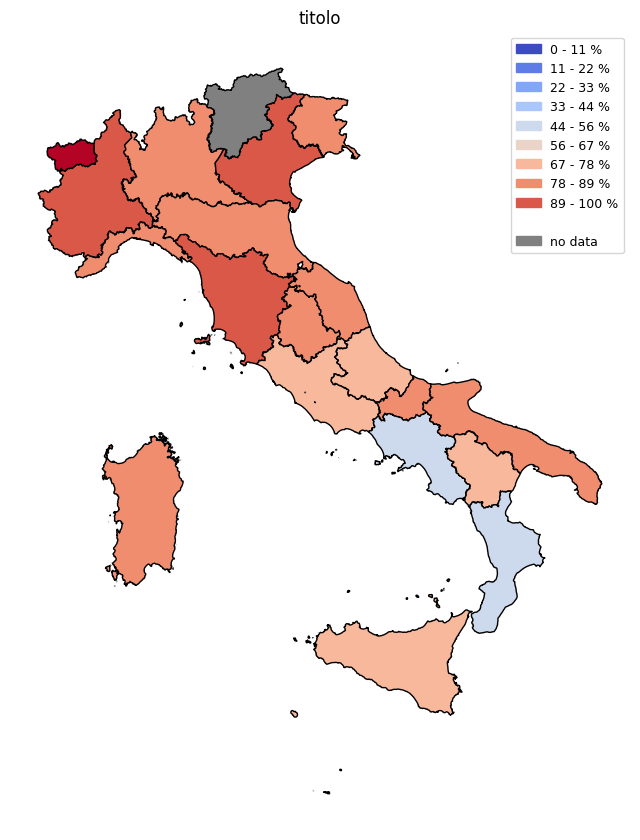

In [12]:
cartina(percentuale_servizi_igienici_disabili, plt.cm.coolwarm, 10, gpd.read_file(filename=(data_dir + 'regioni_shape/regioni.shp')), 'titolo')

# Le scuole nella città 
### Introduzione

La ricerca ha l'obiettivo di analizzare le scuole dal punto di vista dell'inserimento nelle città; ovvero come essere dialogano con l'infrastruttura di trasporto e con l'ambiente circostante.
Le analisi si articolano attraverso i seguenti temi:
- la raggiungibilità delle scuole mediante i mezzi di trasporto pubblici disponibili nella città. 
- l'ambiente in cui si trova la scuola, ovvero la vicinanza della scuola a fonti inquinanti di vario tipo, cimiteri, discariche, ecc.;
questo tema può anche diventare occasione di discutere la qualità e la distribuzione degli agenti inquinanti da un punto di vista pratico, ovvero legato ai luoghi che frequentiamo quotidianamente, piuttosto che da un punto di vista puramente scientifico.
- il superamento delle barriere architettoniche, ovvero la presenza di accorgimenti strutturali che consentono anche a persone con disabilità di fruire in modo completo dell'edificio e dei suoi servizi;
quest'ultimo punto consente di completare il tema della raggiungibilità.

La ricerca porterà le diverse regioni e provincie italiane a confronto, con lo scopo di evidenziare le zone di maggior criticità; queste saranno analizzate in modo approfondito, per identificare nel dettaglio le problematiche e come esse si sono evolute nel tempo.

I dati sono forniti dal ministero dell'istruzione alla seguente pagina: https://dati.istruzione.it/opendata/opendata/catalogo/elements1/?area=Edilizia%20Scolastica


# Raggiungibilità

- scuolabus
- urbani
- interurbani
- ferroviari


INTRODUZIONE:
- 1: Semplice line-chart in cui descriviamo l'andamento della percentuale di scuole raggiungibili per ogni tipo di mezzo pubblico; in questo modo per ogni anno vediamo in percentuale quante scuole sono raggiungibili con un certo mezzo, e vediamo nel tempo se questa percentuale è cambiata o meno; questo grafico ci permette di comprendere quali sono i mezzi presumibilmente più utilizzati per raggiungere le scuole.
- 2: Una cartina epr ogni mezzo, in cui per ogni regione vediamo la percentuale di scuole raggiungibili con quel mezzo; in questo modo possiamo capire come sono distribuiti i mezzi nelle regioni, se si tratta quindi di mezzi utilizzati in modo diffuso in tutta italia o se si concentrano in alcune regioni; la scala dei colori dovrebbe rimanere la stessa per tutte le cartine in modo da mantenere consistenza tra i valori.

barchart tipo mezzo o tipo scuola 
Probabilmente da queste due prime cartine non ricaveremo granché, ma credo abbia senso per farsi un idea generale


SITUAZIONE GENERALE:
- 3: si potrebbero fare delle cartine "riassuntive" che fotografano la situazione generale delle regioni: per ogni regione calcoliamo la percentuale di sucole raggiungibili con almeno un mezzo; potremmo fare una cartina per ogni "numero di mezzi minimi", quindi la cartina delle scuole raggiungibili da un mezzo, quella delle scuole raggiungibili da almeno 2 mezzi e così via. Queste cartine riassuntive dovrebbero consentirci di identificare la regione peggiore e quindi prenderla come caso critico da analizzare in modo più specifico.
Come cartina riassuntiva si potrebbe anche usare, anzichè la percentuale di scuole, il numero di "collegamenti", ovvero se una scuola è raggiunta da 3 mezzi allora dà 3 collegamenti, e calcoliamo la percentuale contando che ogni scula potrebbe avere massimo tot collegamenti; in questo modo potremmo fare un'unica cartina, anche se forse la cartina delle scuole raggiunte da almeno un mezzo potrebbe avere più senso, perché credo sia importante che ci sia almeno un mezzo, piuttosto che se ci sono tanti mezzi per raggiungere una scuola


REGIONE CRITICA:
- 4: line chart in cui vediamo nel tempo se è cambiata la percentuale di scuole raggiunte da almeno un mezzo
- 5: cartina in cui vediamo come la percentuale è distribuita nelle province; se c'è una provincia particolarmente critica potremmo andare a vedere la distribuzione comunale.

### Scuole raggiunte da almeno un mezzo

In [13]:
def get_scuole_1mezzo(dataset):
    return dataset[(dataset.SCUOLABUS == 'SI') | (dataset.TRASPORTIPUBBLICIURBANI == 'SI') | (dataset.TRASPORTIPUBBLICIINTERURBANI == 'SI') | (dataset.TRASPORTIFERROVIARI == 'SI')]

scuole_1mezzo = get_scuole_1mezzo(t_2122)

scuole_1mezzo_1516 = get_scuole_1mezzo(t_1516)
scuole_1mezzo_1718 = get_scuole_1mezzo(t_1718)
scuole_1mezzo_1819 = get_scuole_1mezzo(t_1819)
scuole_1mezzo_2021 = get_scuole_1mezzo(t_2021)
scuole_1mezzo_2122 = scuole_1mezzo

percentuale_1516 = len(scuole_1mezzo_1516) / len(t_1516) * 100
print(percentuale_1516)

percentuale_1718 = len(scuole_1mezzo_1718) / len(t_1718) * 100
print(percentuale_1718)

percentuale_1819 = len(scuole_1mezzo_1819) / len(t_1819) * 100
print(percentuale_1819)

percentuale_2021 = len(scuole_1mezzo_2021) / len(t_2021) * 100
print(percentuale_2021)

percentuale_2122 = len(scuole_1mezzo_2122) / len(t_2122) * 100
print(percentuale_2122)

82.39311865207463
85.488397563146
85.51108845271476
87.62026729714643
89.52394969664262


## LineChart Temporale

([<matplotlib.axis.YTick at 0x7ff16963df10>,
 [Text(0, 50, '50'),
  Text(0, 55, '55'),
  Text(0, 60, '60'),
  Text(0, 65, '65'),
  Text(0, 70, '70'),
  Text(0, 75, '75'),
  Text(0, 80, '80'),
  Text(0, 85, '85'),
  Text(0, 90, '90'),
  Text(0, 95, '95'),
  Text(0, 100, '100')])

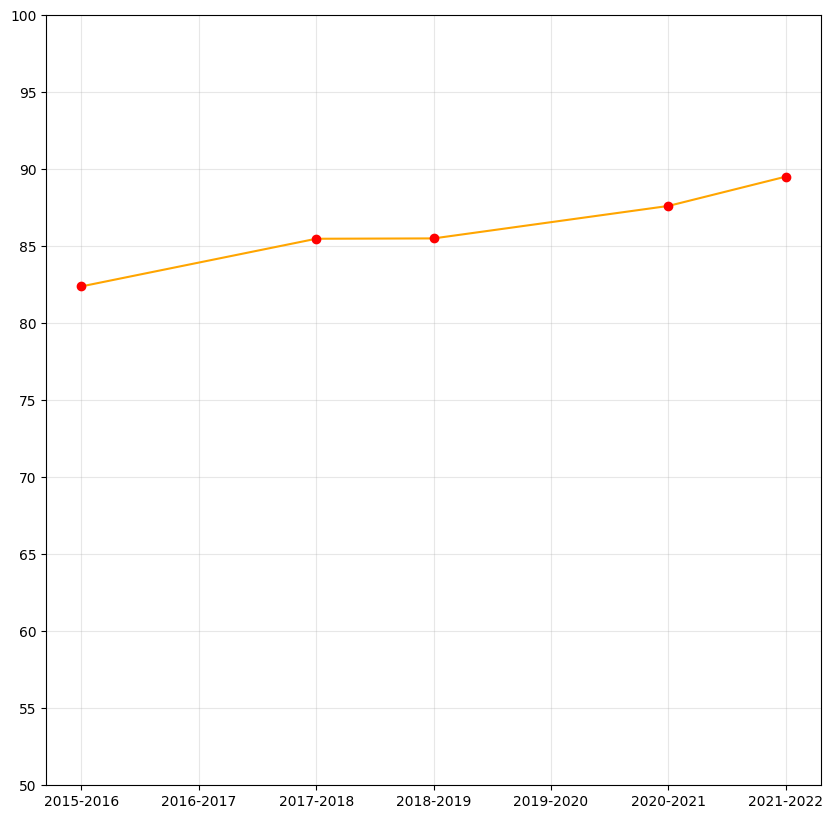

In [14]:
values1 = [percentuale_1516, (percentuale_1718+percentuale_1516)/2, percentuale_1718, percentuale_1819, (percentuale_2021+percentuale_1819)/2, percentuale_2021, percentuale_2122]
values2 = [percentuale_1516, None, percentuale_1718, percentuale_1819, None, percentuale_2021, percentuale_2122]
plt.figure(figsize=(10,10))
plt.ylim([50, 100])

plt.plot(years_labels, values1, linestyle='-', color='orange')
plt.plot(years_labels, values2, marker='o', color='red', linestyle="None")
plt.grid(alpha=0.3)
plt.yticks(np.arange(50, 105, 5))

In [15]:
print(len(get_elementari(elenco_scuole)) / len(elenco_scuole) * 100)
print(len(get_medie(elenco_scuole)) / len(elenco_scuole) * 100)
print(len(get_superiori(elenco_scuole)) / len(elenco_scuole) * 100)

38.19849874895746
25.24816431993982
19.21862990400497


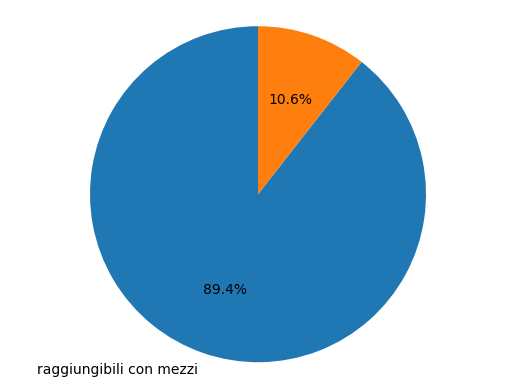

In [16]:
labels = 'raggiungibili con mezzi', ' '
percentuale = len(get_scuole_1mezzo(get_scuole_di_interesse(t_2122))) / len(get_scuole_di_interesse(t_2122)) * 100
sizes = [percentuale, 100-percentuale]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

### Scuole raggiunte dallo scuolabus

In [17]:
scuole_scuolabus = t_2122[t_2122.SCUOLABUS == 'SI']

elementari_scuolabus = get_elementari(scuole_scuolabus)
medie_scuolabus = get_medie(scuole_scuolabus)
superiori_scuolabus = get_superiori(scuole_scuolabus)

In [18]:
percentuali_scuolabus = [
    len(elementari_scuolabus) / len(get_elementari(t_2122)) * 100,
    len(medie_scuolabus) / len(get_medie(t_2122)) * 100,
    len(superiori_scuolabus) / len(get_superiori(t_2122)) * 100
]
percentuale_scuolabus = len(get_scuole_di_interesse(scuole_scuolabus)) / len(get_scuole_di_interesse(t_2122)) * 100

### Scuole raggiunte da trasporti pubblici urbani

In [19]:
scuole_urbano = t_2122[t_2122.TRASPORTIPUBBLICIURBANI == 'SI']

elementari_urbano = get_elementari(scuole_urbano)
medie_urbano = get_medie(scuole_urbano)
superiori_urbano = get_superiori(scuole_urbano)

In [20]:
percentuali_urbano = [
    len(elementari_urbano) / len(get_elementari(t_2122)) * 100,
    len(medie_urbano) / len(get_medie(t_2122)) * 100,
    len(superiori_urbano) / len(get_superiori(t_2122)) * 100
]

percentuale_urbano = len(get_scuole_di_interesse(scuole_urbano)) / len(get_scuole_di_interesse(t_2122)) * 100

### Scuole raggiunte da trasporti pubblici Interurbani

In [21]:
scuole_interurbano = t_2122[t_2122.TRASPORTIPUBBLICIINTERURBANI == 'SI']

elementari_interurbano = get_elementari(scuole_interurbano)
medie_interurbano = get_medie(scuole_interurbano)
superiori_interurbano = get_superiori(scuole_interurbano)

In [22]:
percentuali_interurbano = [
    len(elementari_interurbano) / len(get_elementari(t_2122)) * 100,
    len(medie_interurbano) / len(get_medie(t_2122)) * 100,
    len(superiori_interurbano) / len(get_superiori(t_2122)) * 100
]

percentuale_interurbano = len(get_scuole_di_interesse(scuole_interurbano)) / len(get_scuole_di_interesse(t_2122)) * 100

### Scuole raggiunte da trasporti ferroviari

In [23]:
scuole_ferroviario = t_2122[t_2122.TRASPORTIFERROVIARI == 'SI']

elementari_ferroviario = get_elementari(scuole_ferroviario)
medie_ferroviario = get_medie(scuole_ferroviario)
superiori_ferroviario = get_superiori(scuole_ferroviario)

In [24]:
percentuali_ferroviario = [
    len(elementari_ferroviario) / len(get_elementari(t_2122)) * 100,
    len(medie_ferroviario) / len(get_medie(t_2122)) * 100,
    len(superiori_ferroviario) / len(get_superiori(t_2122)) * 100
]

percentuale_ferroviario = len(get_scuole_di_interesse(scuole_ferroviario)) / len(get_scuole_di_interesse(t_2122)) * 100

### Barchart

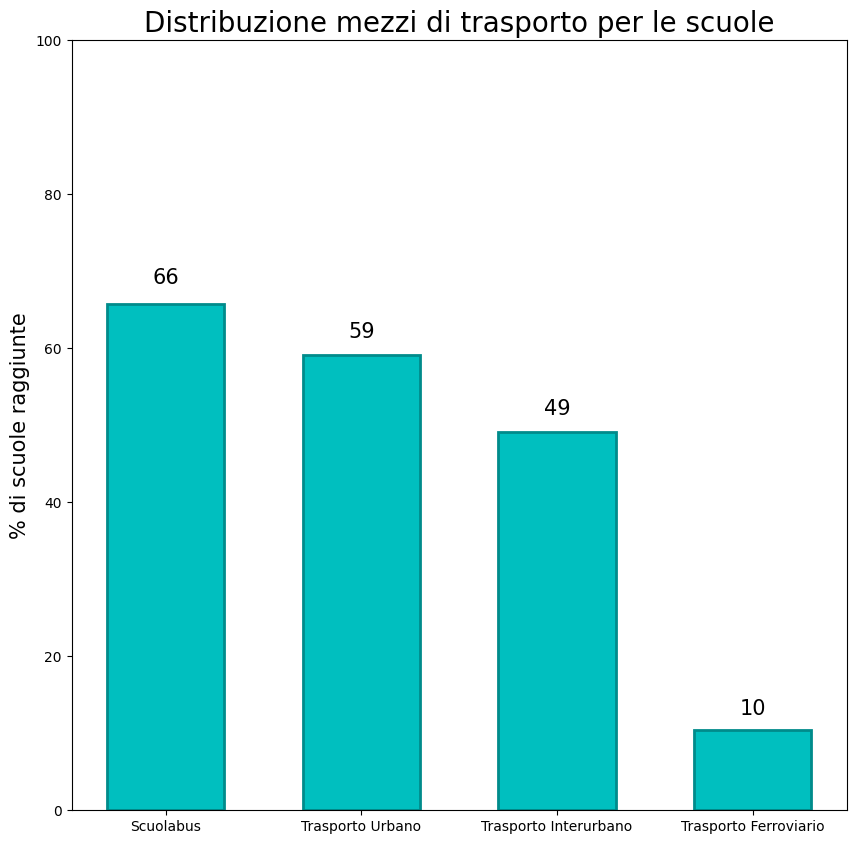

In [25]:
fig, ax = plt.subplots(figsize=(10,10))

plt.ylim([0, 100])

def autolabel(rects):
    for rect in rects:
        height = round(rect.get_height())
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 10),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=15)



mezzi_labels = ['Scuolabus', 'Trasporto Urbano', 'Trasporto Interurbano', 'Trasporto Ferroviario']
percentuali = [percentuale_scuolabus, percentuale_urbano, percentuale_interurbano, percentuale_ferroviario]
plt.title('Distribuzione mezzi di trasporto per le scuole', fontsize=20)
plt.ylabel("% di scuole raggiunte", fontsize=15)

bars = plt.bar(mezzi_labels, percentuali, 0.6, color='c', edgecolor='darkcyan', linewidth=2)
#ax.bar_label(bars)
autolabel(bars)

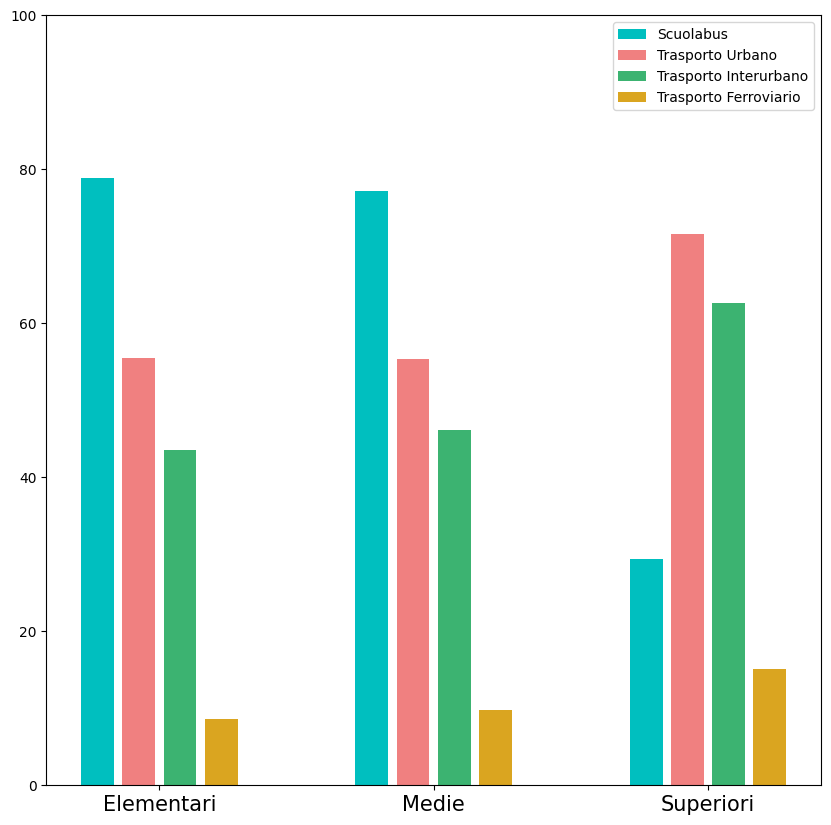

In [26]:
plt.figure(figsize=(10,10))
plt.ylim([0, 100])
width = 0.15
indexes = np.arange(3)
plt.bar(indexes, percentuali_scuolabus, 0.12, color='c', label='Scuolabus')
plt.bar(indexes + width, percentuali_urbano, 0.12, color='lightcoral', label='Trasporto Urbano')
plt.bar(indexes + width*2, percentuali_interurbano, 0.12, color='mediumseagreen', label='Trasporto Interurbano')
plt.bar(indexes + width*3, percentuali_ferroviario, 0.12, color='goldenrod', label='Trasporto Ferroviario')

plt.xticks(indexes + width*1.5, tipi_scuole_labels, fontsize = 15)
plt.legend()

# Cartine

## Cartina 1 Mezzo

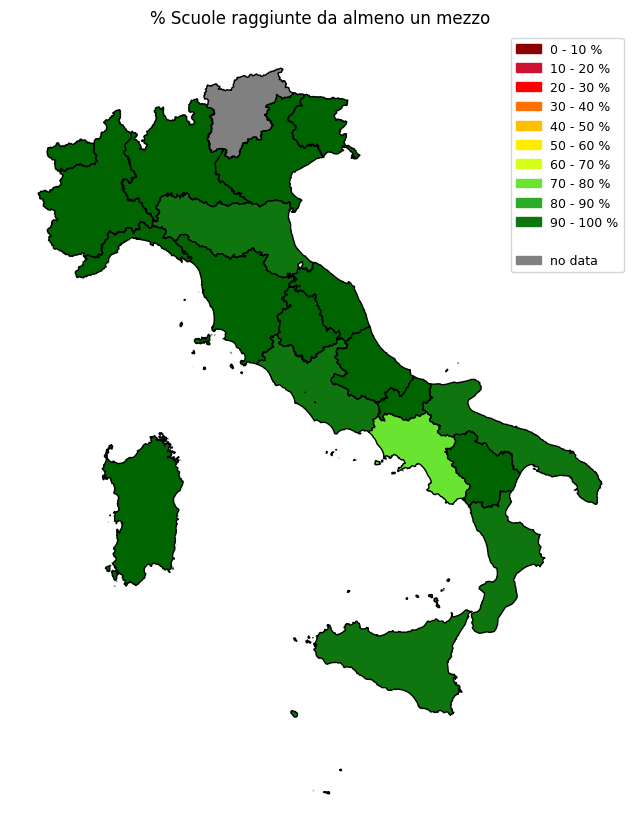

In [27]:
def get_1mezzo_by_region(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        pd.merge(t_2122, elenco_scuole, on='CODICESCUOLA'), 
        elenco_province
    )
    scuole_regione_1mezzo = get_scuole_1mezzo(get_scuole_di_interesse(scuole_regione))
    if(len(scuole_regione_1mezzo) == 0): return 0
    return len(scuole_regione_1mezzo) / len(get_scuole_di_interesse(scuole_regione)) * 100

cartina(get_1mezzo_by_region, cm, 11, shape_regioni, '% Scuole raggiunte da almeno un mezzo')



### Cartina scuolabus

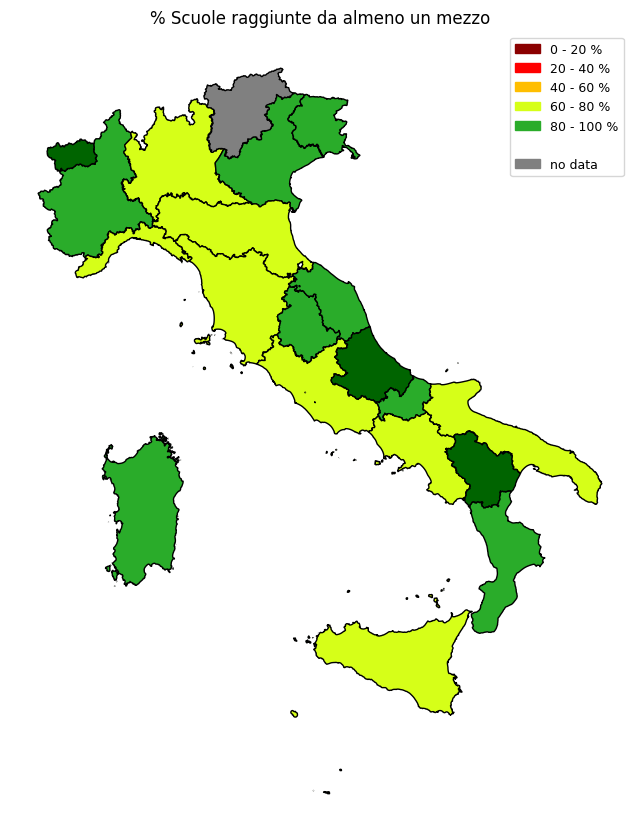

In [28]:
def get_scuolabus_by_region(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        pd.merge(t_2122, elenco_scuole, on='CODICESCUOLA'), 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_scuolabus = scuole_regione[scuole_regione.SCUOLABUS == 'SI']
    return len(get_scuole_di_interesse(scuole_regione_scuolabus)) / len(get_scuole_di_interesse(scuole_regione)) * 100

cartina(get_scuolabus_by_region, cm, 6, shape_regioni, '% Scuole raggiunte da almeno un mezzo')



### Cartina urbano

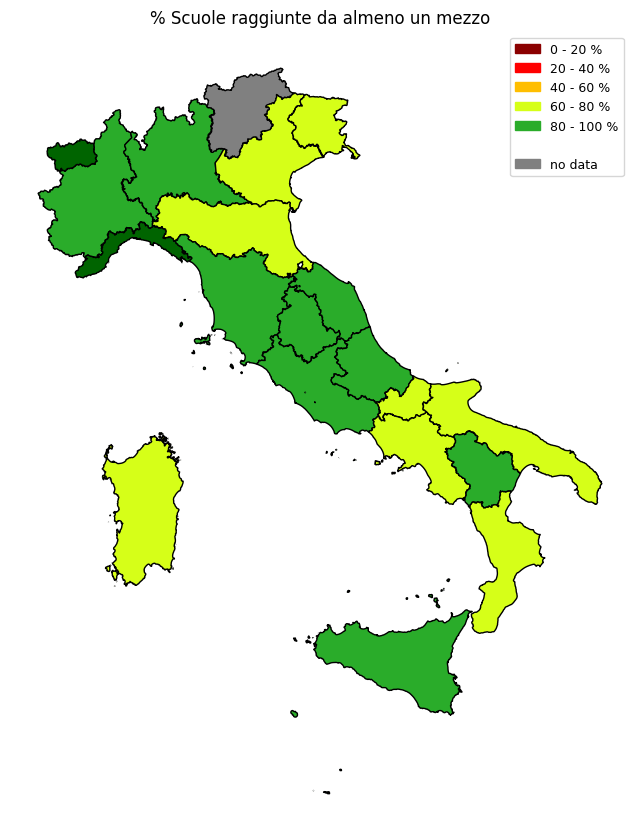

In [29]:
def get_urbano_by_region(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        pd.merge(t_2122, elenco_scuole, on='CODICESCUOLA'), 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_urbano = scuole_regione[scuole_regione.TRASPORTIPUBBLICIURBANI == 'SI']
    return len(get_scuole_di_interesse(scuole_regione_urbano)) / len(get_scuole_di_interesse(scuole_regione)) * 100

cartina(get_urbano_by_region, cm, 6, shape_regioni, '% Scuole raggiunte da almeno un mezzo')



### Cartina interurbano

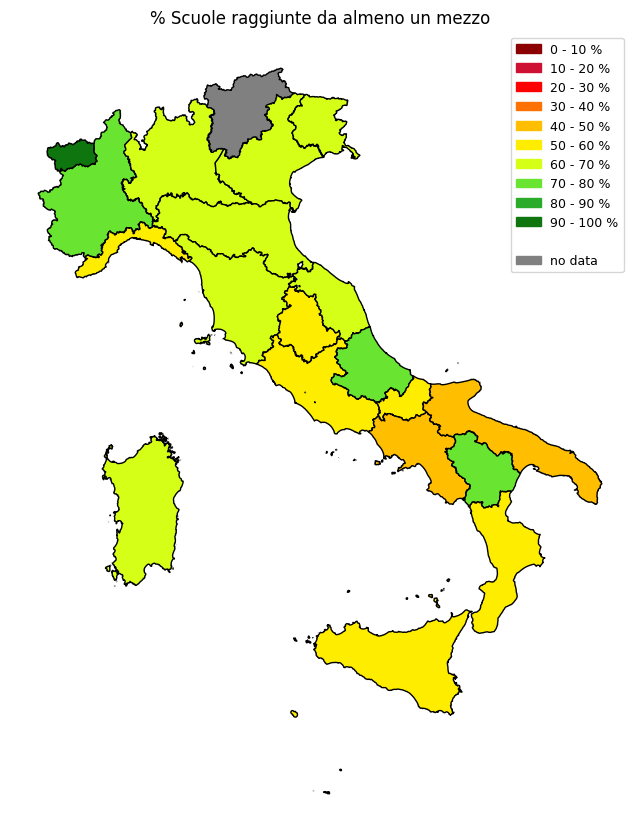

In [30]:
def get_interurbano_by_region(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        pd.merge(t_2122, elenco_scuole, on='CODICESCUOLA'), 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_interurbano = scuole_regione[scuole_regione.TRASPORTIPUBBLICIINTERURBANI == 'SI']
    return len(get_scuole_di_interesse(scuole_regione_interurbano)) / len(get_scuole_di_interesse(scuole_regione)) * 100

cartina(get_interurbano_by_region, cm, 11, shape_regioni, '% Scuole raggiunte da almeno un mezzo')



### Cartina ferroviario

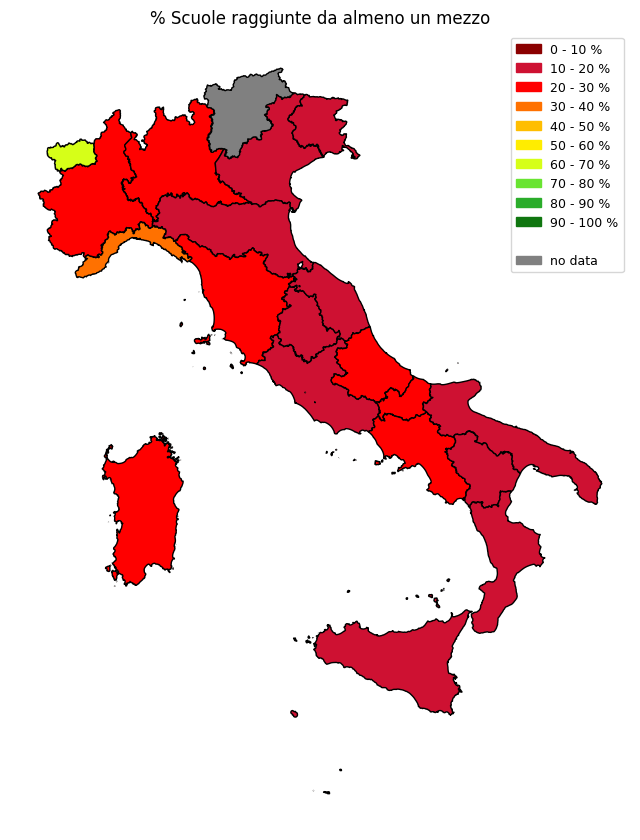

In [31]:
def get_ferroviario_by_region(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        pd.merge(t_2122, elenco_scuole, on='CODICESCUOLA'), 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_ferroviario = scuole_regione[scuole_regione.TRASPORTIFERROVIARI == 'SI']
    return len(get_scuole_di_interesse(scuole_regione_ferroviario)) / len(get_scuole_di_interesse(scuole_regione)) * 100

cartina(get_ferroviario_by_region, cm, 11, shape_regioni, '% Scuole raggiunte da almeno un mezzo')



### Linechart campania


In [32]:
def get_1mezzo_by_region_year(regione, annata):
    scuole_regione = get_scuole_by_region(
                    regione, 
                    pd.merge(annata, elenco_scuole, on='CODICESCUOLA'),
                    elenco_province
    )
    scuole_regione_1mezzo = get_scuole_1mezzo(scuole_regione)
    return len(get_scuole_di_interesse(scuole_regione_1mezzo)) / len(get_scuole_di_interesse(scuole_regione)) * 100

campania_1516 = get_1mezzo_by_region_year('Campania', t_1516)
campania_1718 = get_1mezzo_by_region_year('Campania', t_1718)
campania_1819 = get_1mezzo_by_region_year('Campania', t_1819)
campania_2021 = get_1mezzo_by_region_year('Campania', t_2021)
campania_2122 = get_1mezzo_by_region_year('Campania', t_2122)

lines = [
    campania_1516, 
    (campania_1718+campania_1516)/2, 
    campania_1718, campania_1819, 
    (campania_2021+campania_1819)/2, 
    campania_2021, campania_2122
]
dots = [
    campania_1516, 
    None, 
    campania_1718, 
    campania_1819, 
    None, 
    campania_2021, 
    campania_2122
]

([<matplotlib.axis.YTick at 0x7ff14b8cbc40>,
 [Text(0, 50, '50'),
  Text(0, 55, '55'),
  Text(0, 60, '60'),
  Text(0, 65, '65'),
  Text(0, 70, '70'),
  Text(0, 75, '75'),
  Text(0, 80, '80'),
  Text(0, 85, '85'),
  Text(0, 90, '90'),
  Text(0, 95, '95'),
  Text(0, 100, '100')])

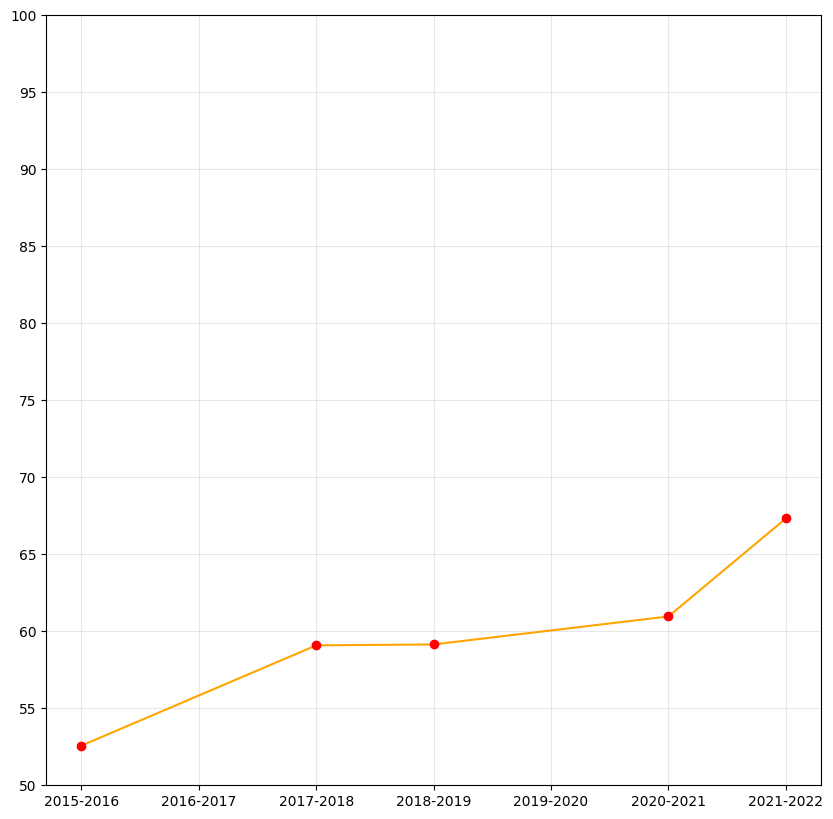

In [33]:
plt.figure(figsize=(10,10))
plt.ylim([50, 100])

plt.plot(years_labels, lines, linestyle='-', color='orange')
plt.plot(years_labels, dots, marker='o', color='red', linestyle="None")
plt.grid(alpha=0.3)
plt.yticks(np.arange(50, 105, 5))

# Ambiente

INTRODUZIONE:
I seguenti punti sono rilevanti per determinare la vivibilità dell'ambiente in cui è inserita la scuola; oltre al tema della salute, legata principalmente agli agenti inquinanti, gli elementi di disturbo come traffico, transiti ferroviari e in generali fonti di inquinamento acustico possono essere determinanti per l'effettiva vivibilità dell'ambiente durante le lezioni e durante i momenti di svago.

- vicinanza discarica
- vicinanza industrie inquinanti
- vicinanza acque inquinate
- vicinanza fonti inquinamento atmosferico
- vicinanza fonti di inquinamento acustico
- vicinanza fonti di radiazioni elettro magnetiche
- presenza grande traffico 
- presenza transito ferroviario
- presenza industrie a rischio

GRAFICI:
- 1: istogramma in cui per ogni categoria si dicono le percentuali di scuole che sono vicini a quella cosa, in modo da individuare l'elemento negativo più presente vicino alle scuole (non ha senso andare a vedere l'andamento negli anni, perché credo siano cose che non cambiano in pochi anni; sarebbe sensato se avessimo i dati di 20 anni forse )
- 2: cartina delle regioni in cui per ogni elemento inquinante mettiamo la percentuale di scuole, così da vedere per esempio in che zona dell'italia sono maggiormente presenti industrie inquinanti vicino alle scuole, in che zona d'italia sono maggiormente presenti altri tipi di fonti inquinanti ecc. -> in questo modo creiamo delle mappe di distribuzione degli agenti inquinanti, il che potrebbe essere molto interessante.
- 3: cartina in cui per ogni regione vediamo la percentuale media di vicinanze, cioè per ogni scuola il numero di cose a cui è vicina, facciamo la media e quindi infine abbiamo per ogni regione un indice di qualità dell'ambiente ( da 0 a 11, dove 0 significa che le scuole sono mediamente vicine a 0 fonti inquinanti, e 11 significa che le scuole sono mediamente vicine a 11 fonti inquinanti diverse); da questa cartina possiamo scegliere quella peggiore e usarla come caso critico

REGIONE CRITICA:
- 4: possiamo fare una sorta di infografica in cui mettiamo insieme i dati ricavati dalle cartine precedenti, ovvero per la regione scelta la percentuale di scuole vicine ad una certa fonte di inquinamento, ecc., così da avere un quadro riassuntivo per quella regione.
- 5: Potenzialmente possiamo fare un discorso provinciale, quindi fare la cartina della percentuale media delle vicinanze per vedere se la situazione varia al variare delle province; se notiamo delle differenze allora potremmo anche fare le cartine in cui vediamo per ogni agente inquinante come è distribuito nelle province, anche se così diventa lungo, potremmo farlo solo per alcuni, magari quelli la cui percentuale è maggiore (tipo sappiamo che per la regione A, una percentuale altissima di scuole è vicina ad un agente inquinante B, allora possiamo vedere la situazione a livello provinciale, e quindi vedere per ogni provincia la percentuale di scuole vicine all'agente inquinante B)

In [34]:
# remove non interesting school from a_2122
a_2122 = get_scuole_di_interesse(a_2122)

In [35]:
a_2122.columns

Index(['ANNOSCOLASTICO', 'CODICESCUOLA', 'CODICEEDIFICIO',
       'CONTESTOSENZADISTURBI', 'VICINANZADISCARICA',
       'VICINANZAINDUSTRIEINQUINANTI', 'VICINANZAACQUEINQUINANTI',
       'VICINANZAFONTIINQUINAMENTOATMOSFERICO',
       'VICINANZAFONTIINQUINAMENTOACUSTICO',
       'VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE', 'VICINANZACIMITERI',
       'VICINANZAALTRIDISTURBI', 'ASSENZAPIAZZOLAADEGUATA', 'AREANONRECINTATA',
       'PRESENZAGRANDETRAFFICO', 'PRESENZATRANSITOFERROVIARIO',
       'PREESISTENZEINDUSTRIALIABBANDONATE', 'ZONAURBANADEGRADATA',
       'VICINANZAINDUSTRIEARISCHIO'],
      dtype='object')

no inquinanti 86.56867491088325 inquinanti 13.431325089116754
inquinamento atmosferico  1278
[0.36306825683228444, 0.8053514060643401, 0.7569423051533688, 2.812128680191876, 6.647449720547463, 2.2576244333934783, 4.7264885798530125, 0.8405580249086828, 0.292655019143599]


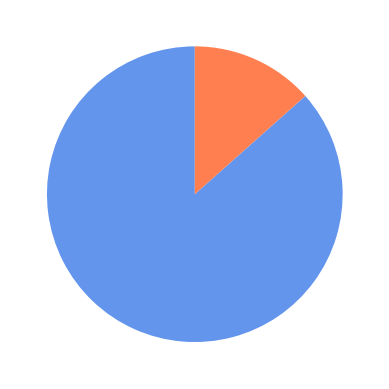

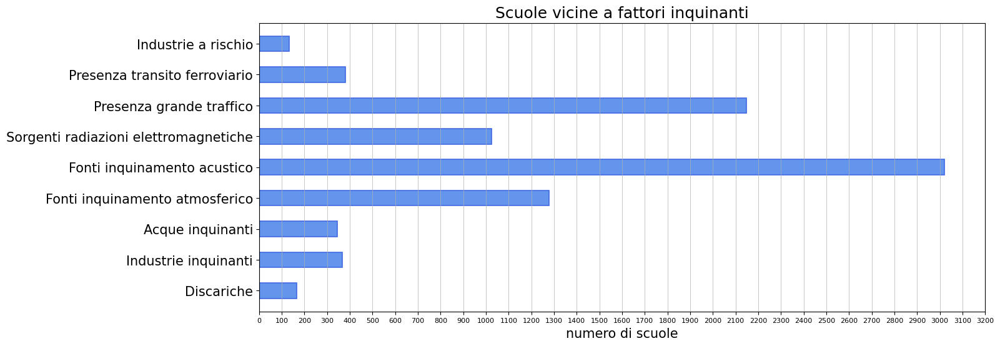

In [67]:
labels = [
    'Discariche',
    'Industrie inquinanti',
    'Acque inquinanti',
    'Fonti inquinamento atmosferico',
    'Fonti inquinamento acustico',
    'Sorgenti radiazioni elettromagnetiche',
    'Presenza grande traffico',
    'Presenza transito ferroviario',
    'Industrie a rischio'
]

scuole_no_inquinanti = a_2122[
    (a_2122.VICINANZADISCARICA == 'NO') &
    (a_2122.VICINANZAINDUSTRIEINQUINANTI == 'NO') &
    (a_2122.VICINANZAACQUEINQUINANTI == 'NO') &
    (a_2122.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'NO') &
    (a_2122.VICINANZAFONTIINQUINAMENTOACUSTICO == 'NO') &
    (a_2122.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'NO') &
    (a_2122.PRESENZAGRANDETRAFFICO == 'NO') &
    (a_2122.PRESENZATRANSITOFERROVIARIO == 'NO') &
    (a_2122.VICINANZAINDUSTRIEARISCHIO == 'NO')
]

percentuale_no_inquinanti = len(scuole_no_inquinanti) / len(a_2122) * 100
plt.pie([percentuale_no_inquinanti, 100 - percentuale_no_inquinanti], startangle=90, colors=['cornflowerblue', 'coral'])
print("no inquinanti", percentuale_no_inquinanti, "inquinanti", 100 - percentuale_no_inquinanti)

values = [
    len(a_2122[a_2122.VICINANZADISCARICA == 'SI']),
    len(a_2122[a_2122.VICINANZAINDUSTRIEINQUINANTI == 'SI']),
    len(a_2122[a_2122.VICINANZAACQUEINQUINANTI == 'SI']),
    len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']),
    len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI']),
    len(a_2122[a_2122.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI']),
    len(a_2122[a_2122.PRESENZAGRANDETRAFFICO == 'SI']),
    len(a_2122[a_2122.PRESENZATRANSITOFERROVIARIO == 'SI']),
    len(a_2122[a_2122.VICINANZAINDUSTRIEARISCHIO == 'SI'])
]

print("inquinamento atmosferico ", len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']))
percentuali = [
    len(a_2122[a_2122.VICINANZADISCARICA == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAINDUSTRIEINQUINANTI == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAACQUEINQUINANTI == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.PRESENZAGRANDETRAFFICO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.PRESENZATRANSITOFERROVIARIO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAINDUSTRIEARISCHIO == 'SI']) / len(a_2122) * 100
]

fig, ax = plt.subplots(figsize=(15, 6))
bars = plt.barh(labels, values, height=0.5, color='cornflowerblue', edgecolor='royalblue', linewidth=1.2)
plt.xticks(np.arange(0, 3300, 100), fontsize=8)
plt.yticks(fontsize=15)
plt.xlabel("numero di scuole", fontsize=15)
plt.grid(linewidth=0.5, axis='x')
plt.title("Scuole vicine a fattori inquinanti", fontsize=18)

def autolabel(rects):
    for rect in rects:
        width = round(rect.get_width())
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 10),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=18)

#autolabel(bars)

print(percentuali)



## Linechart

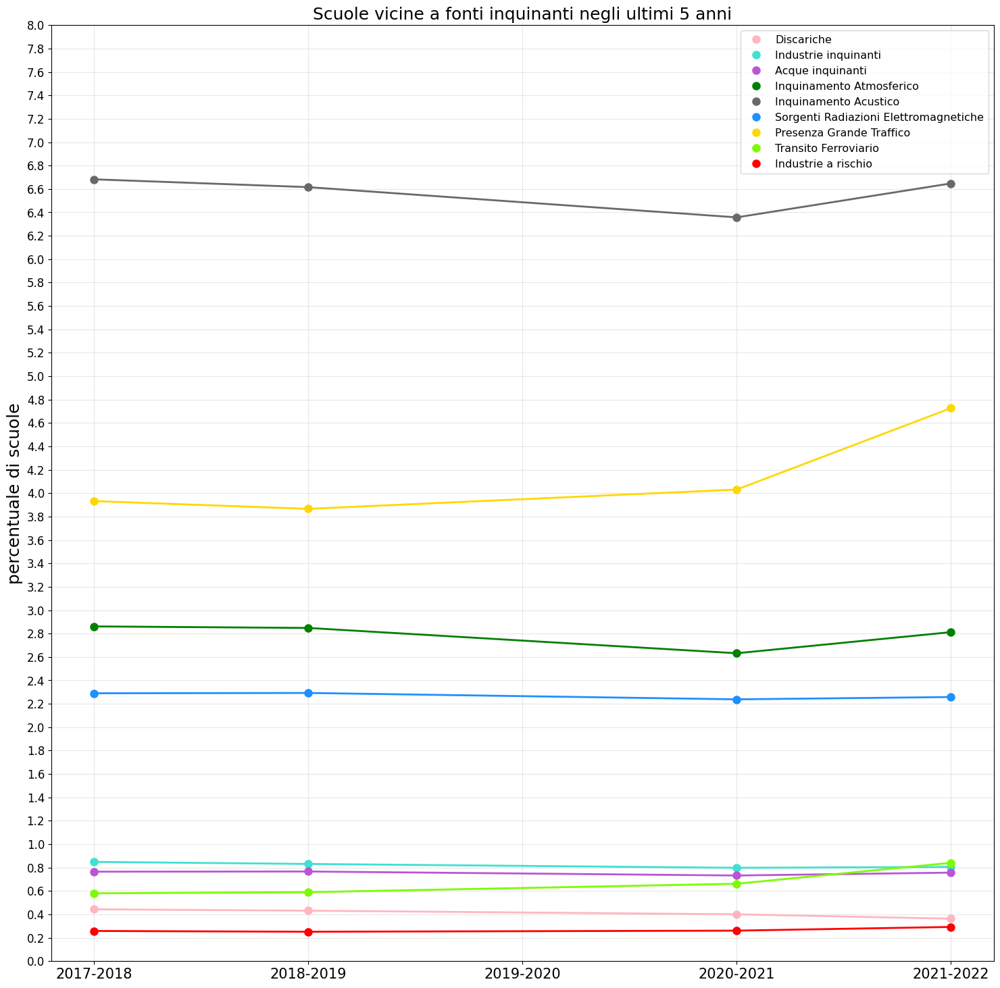

In [68]:
percentuali_1718 = [
    len(a_1718[a_1718.VICINANZADISCARICA == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.VICINANZAINDUSTRIEINQUINANTI == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.VICINANZAACQUEINQUINANTI == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.PRESENZAGRANDETRAFFICO == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.PRESENZATRANSITOFERROVIARIO == 'SI']) / len(a_1718) * 100,
    len(a_1718[a_1718.VICINANZAINDUSTRIEARISCHIO == 'SI']) / len(a_1718) * 100
]
percentuali_1819 = [
    len(a_1819[a_1819.VICINANZADISCARICA == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.VICINANZAINDUSTRIEINQUINANTI == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.VICINANZAACQUEINQUINANTI == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.PRESENZAGRANDETRAFFICO == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.PRESENZATRANSITOFERROVIARIO == 'SI']) / len(a_1819) * 100,
    len(a_1819[a_1819.VICINANZAINDUSTRIEARISCHIO == 'SI']) / len(a_1819) * 100
]
percentuali_2021 = [
    len(a_2021[a_2021.VICINANZADISCARICA == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.VICINANZAINDUSTRIEINQUINANTI == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.VICINANZAACQUEINQUINANTI == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.PRESENZAGRANDETRAFFICO == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.PRESENZATRANSITOFERROVIARIO == 'SI']) / len(a_2021) * 100,
    len(a_2021[a_2021.VICINANZAINDUSTRIEARISCHIO == 'SI']) / len(a_2021) * 100
]
percentuali_2122 = [
    len(a_2122[a_2122.VICINANZADISCARICA == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAINDUSTRIEINQUINANTI == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAACQUEINQUINANTI == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.PRESENZAGRANDETRAFFICO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.PRESENZATRANSITOFERROVIARIO == 'SI']) / len(a_2122) * 100,
    len(a_2122[a_2122.VICINANZAINDUSTRIEARISCHIO == 'SI']) / len(a_2122) * 100
]

labels_fonti = ['Discariche', 
                'Industrie inquinanti', 
                'Acque inquinanti', 
                'Inquinamento Atmosferico',
                'Inquinamento Acustico',
                'Sorgenti Radiazioni Elettromagnetiche',
                'Presenza Grande Traffico',
                'Transito Ferroviario',
                'Industrie a rischio'
]
colors = [
    'lightpink',
    'turquoise',#
    'mediumorchid',#
    'g',
    'dimgray',
    'dodgerblue',#
    'gold',#
    'lawngreen',
    'r'#
]
labels = ['2017-2018', '2018-2019', '2019-2020', '2020-2021', '2021-2022']

plt.figure(figsize=(18,18))
plt.ylim([0, 8])
plt.grid(alpha=0.3)
plt.yticks(np.arange(0, 8.1, 0.2), fontsize=12)
plt.xticks(fontsize=15)
plt.title("Scuole vicine a fonti inquinanti negli ultimi 5 anni", fontsize=18)
plt.ylabel("percentuale di scuole", fontsize=18)

for i in range(len(percentuali_1718)):
    lines = [percentuali_1718[i], percentuali_1819[i], (percentuali_2021[i]+percentuali_1819[i])/2, percentuali_2021[i], percentuali_2122[i]]
    dots = [percentuali_1718[i], percentuali_1819[i], None, percentuali_2021[i], percentuali_2122[i]]
    plt.plot(labels, lines, linestyle='-', color=colors[i], linewidth=2)
    plt.plot(labels, dots, marker='o', color=colors[i], linestyle="None", label=labels_fonti[i], markersize=8)

plt.legend(fontsize=11.5)



## Cartine


### Industrie a rischio

In [38]:
# merge a_2122 with elenco_scuole to get additional info
scuole_ambiente = pd.merge(elenco_scuole, a_2122, on='CODICESCUOLA', suffixes=('', '_y'))
scuole_ambiente.drop(scuole_ambiente.filter(regex='_y$').columns, axis=1, inplace=True)
scuole_ambiente.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO'], inplace=True)
scuole_ambiente

,ANNOSCOLASTICO,CODICESCUOLA,CODICEEDIFICIO,CODICECOMUNE,DESCRIZIONECOMUNE,SIGLAPROVINCIA,TIPOLOGIAINDIRIZZO,DENOMINAZIONEINDIRIZZO,NUMEROCIVICO,CAP,CONTESTOSENZADISTURBI,VICINANZADISCARICA,VICINANZAINDUSTRIEINQUINANTI,VICINANZAACQUEINQUINANTI,VICINANZAFONTIINQUINAMENTOATMOSFERICO,VICINANZAFONTIINQUINAMENTOACUSTICO,VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE,VICINANZACIMITERI,VICINANZAALTRIDISTURBI,ASSENZAPIAZZOLAADEGUATA,AREANONRECINTATA,PRESENZAGRANDETRAFFICO,PRESENZATRANSITOFERROVIARIO,PREESISTENZEINDUSTRIALIABBANDONATE,ZONAURBANADEGRADATA,VICINANZAINDUSTRIEARISCHIO
0,202122,RMEE8DZ086,580013134,58001,AFFILE,RM,Via,Don Giovanni Rossi,s.n.c.,00021,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
1,202122,BGIS033008,162190782,16219,TREVIGLIO,BG,Via,CARAVAGGIO,50,24047,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
3,202122,BGIS033008,162190651,16219,TREVIGLIO,BG,Via,GALVANI,7,24047,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
5,202122,MNMM80206T,200410540,20041,PIUBEGA,MN,Via,ROMA,36,46040,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
7,202122,MNMM80206T,200410201,20041,PIUBEGA,MN,Via,ROMA,40,46040,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78299,202122,FOIC80700R,400180061,40018,LONGIANO,FC,Via,CIRCONVALLAZIONE,1102,47020,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
78300,202122,NUIC880002,910240896,91024,FONNI,NU,Piazza,MATTEOTTI,SN,08023,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
78301,202122,VAIC835008,121060001,12106,MORNAGO,VA,Via,Volta,9,21020,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,NO,NO,NO,NO,NO,NO
78302,202122,BNMM84501L,620080201,62008,BENEVENTO,BN,Via,NICOLA SALA,11,82100,NO,NO,NO,NO,NO,NO,NO,NO,_,NO,SI,NO,NO,NO,NO,NO


In [39]:
comuni = gpd.read_file(filename='comuni_shape/comuni.shp')
comuni.COMUNE = comuni.COMUNE.str.upper()

numero_scuole = scuole_ambiente.groupby(by=['DESCRIZIONECOMUNE'])['DESCRIZIONECOMUNE'].count().reset_index(name="count")

comuni = pd.merge(comuni, numero_scuole, left_on='COMUNE', right_on='DESCRIZIONECOMUNE', how='left', )

comuni.replace(np.nan, 0, inplace=True)

In [40]:
comuni.columns

Index(['COD_RIP', 'COD_REG', 'COD_PROV', 'COD_CM', 'COD_UTS', 'PRO_COM',
       'PRO_COM_T', 'COMUNE', 'COMUNE_A', 'CC_UTS', 'Shape_Leng', 'Shape_Area',
       'geometry', 'DESCRIZIONECOMUNE', 'count'],
      dtype='object')

In [41]:
scuole_industrie_rischio = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZAINDUSTRIEARISCHIO == 'SI'], on='CODICESCUOLA')
scuole_industrie_rischio = scuole_industrie_rischio.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

print(scuole_industrie_rischio[scuole_industrie_rischio.DESCRIZIONECOMUNE == 'LEVATE'])

scuole_discariche = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZADISCARICA == 'SI'], on='CODICESCUOLA')
scuole_discariche = scuole_discariche.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_industrie = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZAINDUSTRIEINQUINANTI == 'SI'], on='CODICESCUOLA')
scuole_industrie = scuole_industrie.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_acque = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZAACQUEINQUINANTI == 'SI'], on='CODICESCUOLA')
scuole_acque = scuole_acque.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_atmosferico = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZAFONTIINQUINAMENTOATMOSFERICO == 'SI'], on='CODICESCUOLA')
scuole_atmosferico = scuole_atmosferico.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_acustico = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZAFONTIINQUINAMENTOACUSTICO == 'SI'], on='CODICESCUOLA')
scuole_acustico = scuole_acustico.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_radiazioni = pd.merge(elenco_scuole, a_2122[a_2122.VICINANZASORGENTIRADIAZIONIELETTROMAGNETICHE == 'SI'], on='CODICESCUOLA')
scuole_radiazioni = scuole_radiazioni.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_traffico = pd.merge(elenco_scuole, a_2122[a_2122.PRESENZAGRANDETRAFFICO == 'SI'], on='CODICESCUOLA')
scuole_traffico = scuole_traffico.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

scuole_trafficoferroviario = pd.merge(elenco_scuole, a_2122[a_2122.PRESENZATRANSITOFERROVIARIO == 'SI'], on='CODICESCUOLA')
scuole_trafficoferroviario = scuole_trafficoferroviario.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

def get_percentuale(dataset, x):
    numero_scuole_comune = comuni[comuni.COMUNE == x]['count'].tolist()[0]
    if numero_scuole_comune == 0: return 0
    if x == 'AOSTA': print(len(dataset[dataset.DESCRIZIONECOMUNE == x]) / numero_scuole_comune * 100)
    return len(dataset[dataset.DESCRIZIONECOMUNE == x]) / numero_scuole_comune * 100

def get_count(dataset, x):
    return len(dataset[dataset.DESCRIZIONECOMUNE == x])

    ANNOSCOLASTICO_x CODICESCUOLA  CODICEEDIFICIO_x  CODICECOMUNE  \
3             202122   BGEE854017         161260469         16126   
7             202122   BGEE854017         161260002         16126   
11            202122   BGEE854017         161260001         16126   
15            202122   BGEE854017         161260748         16126   
21            202122   BGMM854027         161260002         16126   
25            202122   BGMM854027         161260001         16126   
29            202122   BGMM854027         161260748         16126   
33            202122   BGMM854027         161260469         16126   

   DESCRIZIONECOMUNE SIGLAPROVINCIA TIPOLOGIAINDIRIZZO DENOMINAZIONEINDIRIZZO  \
3             LEVATE             BG                Via              Santuario   
7             LEVATE             BG                Via              Santuario   
11            LEVATE             BG                Via            IV NOVENBRE   
15            LEVATE             BG                Via

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


<AxesSubplot: >

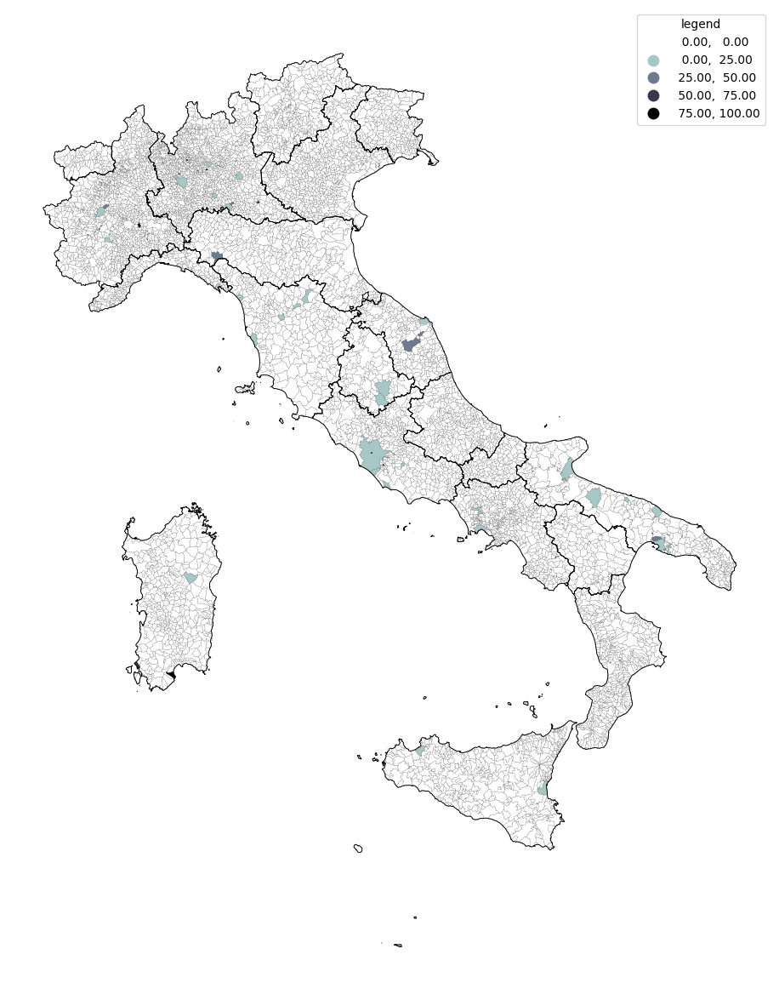

In [42]:
# ADD DATA COLUMN
comuni['RISCHIO'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_industrie_rischio, x))
comuni['DISCARICHE'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_discariche, x))
comuni['INDUSTRIE'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_industrie, x))
comuni['ACQUE'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_acque, x))
comuni['ATMOSFERICO'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_atmosferico, x))
comuni['ACUSTICO'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_acustico, x))
comuni['RADIAZIONI'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_radiazioni, x))
comuni['TRAFFICO'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_traffico, x))
comuni['TRAFFICOFERROVIARIO'] = comuni.COMUNE.apply(lambda x : get_percentuale(scuole_trafficoferroviario, x))

comuni['RISCHIO_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_industrie_rischio, x))
comuni['DISCARICHE_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_discariche, x))
comuni['INDUSTRIE_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_industrie, x))
comuni['ACQUE_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_acque, x))
comuni['ATMOSFERICO_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_atmosferico, x))
comuni['ACUSTICO_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_acustico, x))
comuni['RADIAZIONI_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_radiazioni, x))
comuni['TRAFFICO_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_traffico, x))
comuni['TRAFFICOFERROVIARIO_C'] = comuni.COMUNE.apply(lambda x : get_count(scuole_trafficoferroviario, x))

fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(comuni.RISCHIO.min(), comuni.RISCHIO.max(), 5)
    
#plot
comuni.plot(column='RISCHIO', cmap=plt.cm.get_cmap('bone_r'), ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

### Discariche 

<AxesSubplot: >

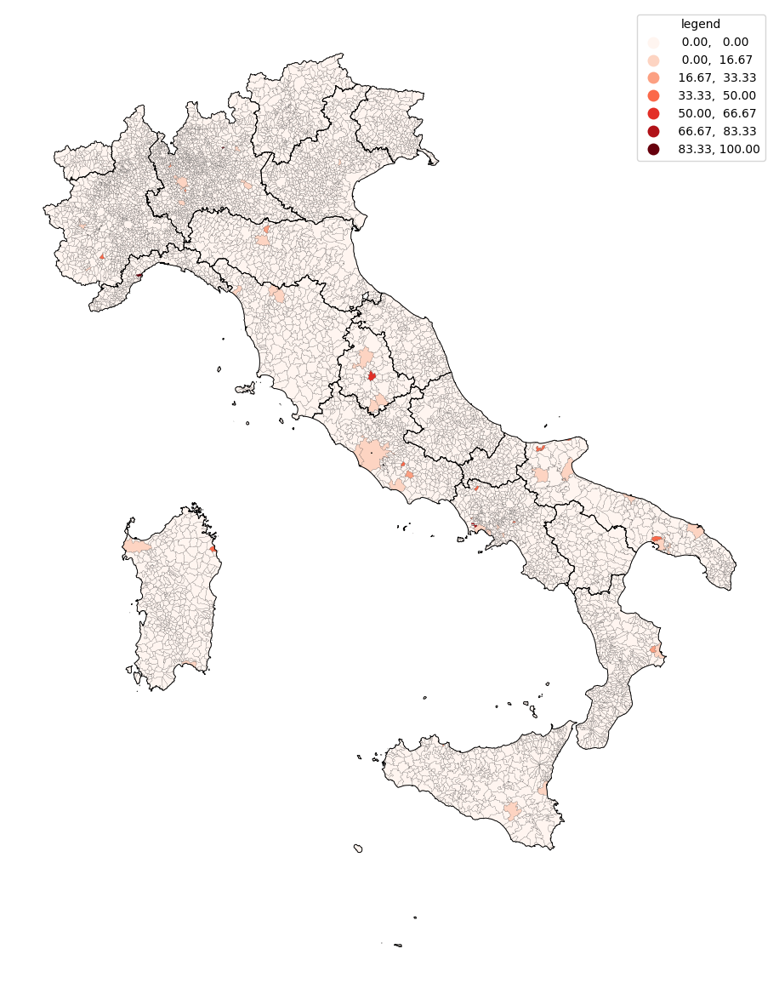

In [43]:
fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.DISCARICHE.max(), 7)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='DISCARICHE', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

In [85]:
comuni_points = comuni.copy()
comuni_points['geometry'] = comuni['geometry'].centroid

regioni_explore = regioni.explore(
    tooltip='DEN_REG',
    tooltip_kwds=dict(labels=False),
    style_kwds=dict(opacity=1, weight=0.5),
    name='Regioni'
)

print(comuni_points[comuni_points.COMUNE == "AOSTA"])

comuni_explore_rischio = comuni_points.drop(comuni[comuni['RISCHIO'] == 0].index)
comuni_explore_discariche = comuni_points.drop(comuni[comuni['DISCARICHE'] == 0].index)
comuni_explore_industrie = comuni_points.drop(comuni[comuni['INDUSTRIE'] == 0].index)
comuni_explore_acque = comuni_points.drop(comuni[comuni['ACQUE'] == 0].index)
comuni_explore_atmosferico = comuni_points.drop(comuni[comuni['ATMOSFERICO'] == 0].index)
comuni_explore_acustico = comuni_points.drop(comuni[comuni['ACUSTICO'] == 0].index)
comuni_explore_traffico = comuni_points.drop(comuni[comuni['TRAFFICO'] == 0].index)
comuni_explore_ferroviario = comuni_points.drop(comuni[comuni['TRAFFICOFERROVIARIO'] == 0].index)
comuni_explore_radiazioni = comuni_points.drop(comuni[comuni['RADIAZIONI'] == 0].index)


#### RISCHIO
comuni_explore_rischio['RISCHIO_R'] = comuni_explore_rischio.RISCHIO.apply(lambda x: round(x, 2))
comuni_explore_rischio.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-triangle-exclamation" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='RISCHIO',
    cmap='autumn_r',
    tooltip=['COMUNE', 'RISCHIO_R', 'RISCHIO_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a industrie a rischio", '#scuole totali nel comune'],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Industrie a rischio',
    legend_kwds={'caption':"Percentuale di scuole"}
)

#### DISCARICHE
comuni_explore_discariche['DISCARICHE_R'] = comuni_explore_discariche.DISCARICHE.apply(lambda x: round(x, 2))
comuni_explore_discariche.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-dumpster" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='DISCARICHE',
    cmap='autumn_r',
    tooltip=['COMUNE', 'DISCARICHE_R', 'DISCARICHE_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a discariche", "#scuole totali nel comune"],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Discariche',
    legend=False
)

#### INDUSTRIE
comuni_explore_industrie['INDUSTRIE_R'] = comuni_explore_industrie.INDUSTRIE.apply(lambda x: round(x, 2))
comuni_explore_industrie.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-industry" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='INDUSTRIE',
    cmap='autumn_r',
    tooltip=['COMUNE', 'INDUSTRIE_R', 'INDUSTRIE_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a industrie inquinanti", "#scuole totali nel comune"],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Industrie inquinanti',
    legend=False
)
#### ACQUE
comuni_explore_acque['ACQUE_R'] = comuni_explore_acque.ACQUE.apply(lambda x: round(x, 2))
comuni_explore_acque.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-water" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='ACQUE',
    cmap='autumn_r',
    tooltip=['COMUNE', 'ACQUE_R', 'ACQUE_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicina ad acque inquinanti", '#scuole totali nel comune'],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Acque inquinanti',
    legend=False
)
 #### ATMOSFERICO
comuni_explore_atmosferico['ATMOSFERICO_R'] = comuni_explore_atmosferico.ATMOSFERICO.apply(lambda x: round(x, 2))
comuni_explore_atmosferico.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-smog" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='ATMOSFERICO',
    cmap='autumn_r',
    tooltip=['COMUNE', 'ATMOSFERICO_R', 'ATMOSFERICO_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a fonti di inquinamento atmosferico", "#scuole totali nel comune"],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Fonti di inquinamento atmosferico',
    legend=False
)

#### ACUSTICO
comuni_explore_acustico['ACUSTICO_R'] = comuni_explore_acustico.ACUSTICO.apply(lambda x: round(x, 2))
comuni_explore_acustico.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-volume-high" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='ACUSTICO',
    cmap='autumn_r',
    tooltip=['COMUNE', 'ACUSTICO_R', 'ACUSTICO_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a fonti di inquinamento acustico", '#scuole totali nel comune'],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Fonti di inquinamento Acustico',
    legend=False
)

comuni_explore_traffico['TRAFFICO_R'] = comuni_explore_traffico.TRAFFICO.apply(lambda x: round(x, 2))
comuni_explore_traffico.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-car" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='TRAFFICO',
    cmap='autumn_r',
    tooltip=['COMUNE', 'TRAFFICO_R', 'TRAFFICO_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a grande traffico", '#scuole totali nel comune'],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Presenza grande traffico',
    legend=False
)

comuni_explore_ferroviario['TRAFFICOFERROVIARIO_R'] = comuni_explore_ferroviario.TRAFFICOFERROVIARIO.apply(lambda x: round(x, 2))
'''
#### TRAFFICO FERROVIARIO
comuni_explore_ferroviario.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-train" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
   column='TRAFFICOFERROVIARIO',
    cmap='autumn_r',
    tooltip=['COMUNE', 'TRAFFICOFERROVIARIO'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "numero di scuole"],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Traffico ferroviario',
    legend=False
)
'''

comuni_explore_radiazioni['RADIAZIONI_R'] = comuni_explore_radiazioni.RADIAZIONI.apply(lambda x: round(x, 2))
#### RADIAZIONI
rad = comuni_explore_radiazioni.explore(
    style_kwds=dict(
        style_function=lambda x: {
            "html": f"""<span   class="fa-solid fa-circle-radiation" 
                                style="color:{x["properties"]["__folium_color"]};
                                font-size:16px"></span>"""
        },
    ),
    m = regioni_explore,
    column='RADIAZIONI_R',
    cmap='autumn_r',
    tooltip=['COMUNE', 'RADIAZIONI_R', 'RADIAZIONI_C', 'count'],
    tooltip_kwds=dict(labels=True,aliases=["Comune", "% di scuole", "#scuole vicine a \nsorgenti di radiazioni elettromagnetiche", "#scuole totali nel comune"],style='background-color: grey; color: white;'),
    marker_type="marker",
    marker_kwds=dict(icon=folium.DivIcon()),
    name='Sorgenti di radiazioni elettromagnetiche',
    legend=False
)

layer_control = folium.LayerControl().add_to(regioni_explore)

#regioni_explore.save("mappa_interattiva.html")

regioni_explore.save("mappa_interattiva_2.html")

      COD_RIP  COD_REG  COD_PROV  COD_CM  COD_UTS  PRO_COM PRO_COM_T COMUNE  \
1279        1        2         7       0        7     7003    007003  AOSTA   

     COMUNE_A  CC_UTS    Shape_Leng    Shape_Area  \
1279        0       1  25098.246209  2.115238e+07   

                            geometry DESCRIZIONECOMUNE  count  RISCHIO  \
1279  POINT (367880.642 5067595.195)             AOSTA    8.0      0.0   

      DISCARICHE  INDUSTRIE  ACQUE  ATMOSFERICO  ACUSTICO  RADIAZIONI  \
1279         0.0        0.0    0.0          0.0       0.0         0.0   

      TRAFFICO  TRAFFICOFERROVIARIO  RISCHIO_C  DISCARICHE_C  INDUSTRIE_C  \
1279       0.0                  0.0          0             0            0   

      ACQUE_C  ATMOSFERICO_C  ACUSTICO_C  RADIAZIONI_C  TRAFFICO_C  \
1279        0              0           0             0           0   

      TRAFFICOFERROVIARIO_C  
1279                      0  


In [45]:
print(comuni)

      COD_RIP  COD_REG  COD_PROV  COD_CM  COD_UTS  PRO_COM PRO_COM_T  \
0           1        1         1     201      201     1001    001001   
1           1        1         1     201      201     1002    001002   
2           1        1         1     201      201     1003    001003   
3           1        1         1     201      201     1004    001004   
4           1        1         1     201      201     1006    001006   
...       ...      ...       ...     ...      ...      ...       ...   
7899        5       20       111       0      111   111103    111103   
7900        5       20       111       0      111   111104    111104   
7901        5       20       111       0      111   111105    111105   
7902        5       20       111       0      111   111106    111106   
7903        5       20       111       0      111   111107    111107   

               COMUNE COMUNE_A  CC_UTS     Shape_Leng    Shape_Area  \
0              AGLIÃ¨        0       0   16097.848297  1.330696e

<AxesSubplot: >

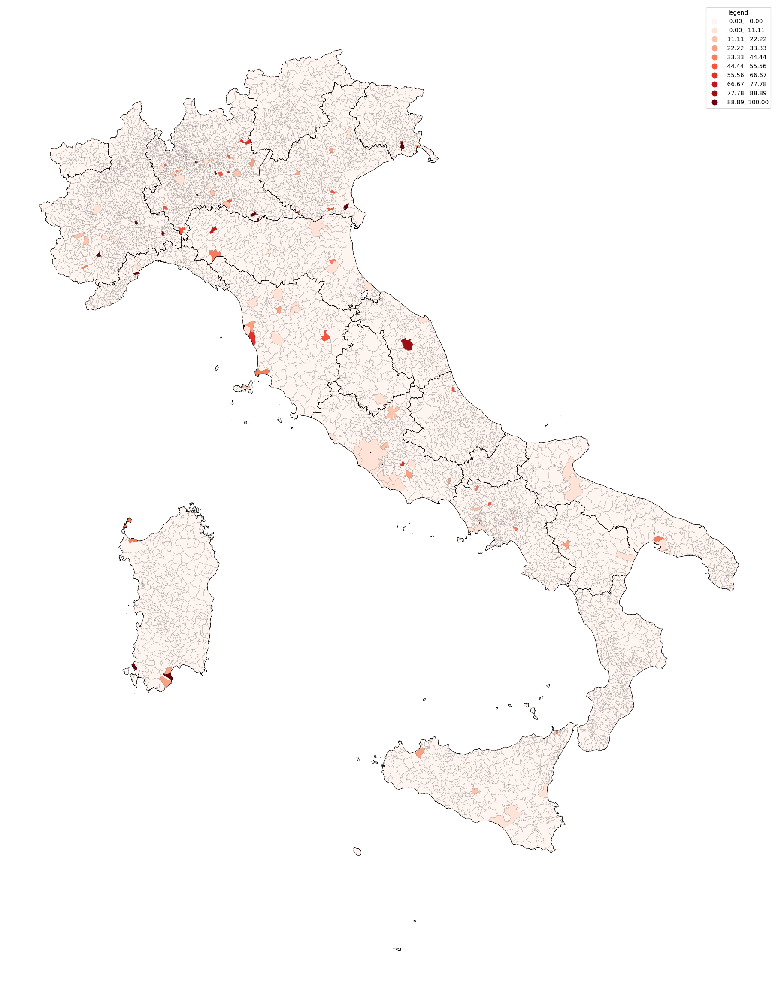

In [46]:
fig, ax = plt.subplots(1, figsize=(30, 30))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.INDUSTRIE.max(), 10)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='INDUSTRIE', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

<AxesSubplot: >

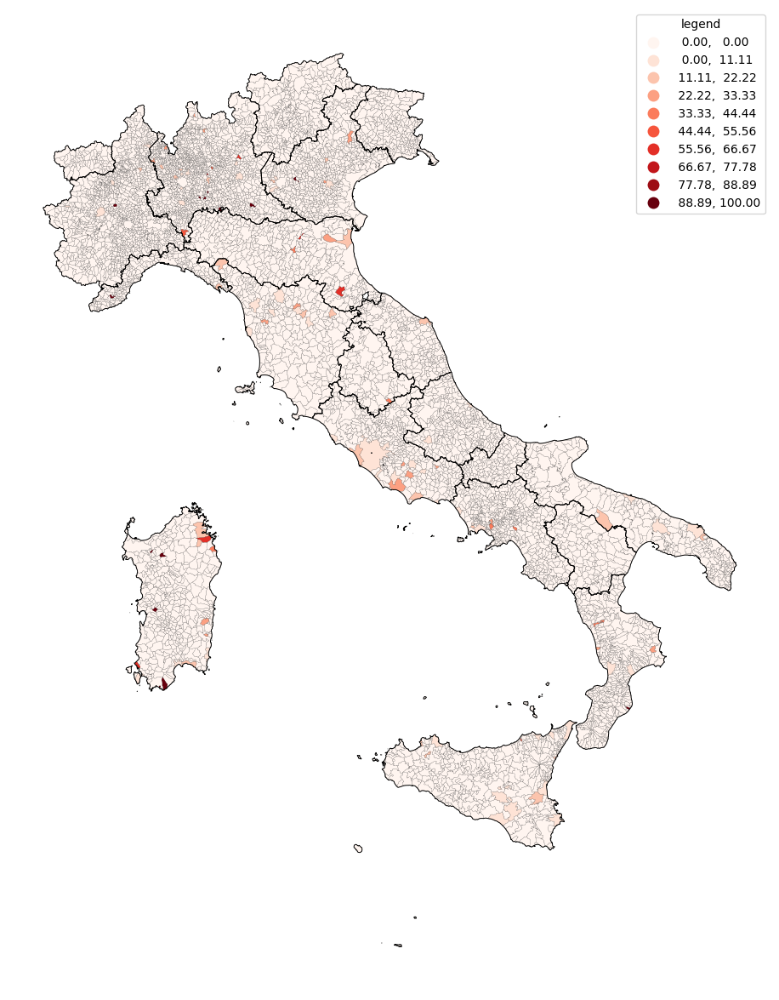

In [47]:
fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.ACQUE.max(), 10)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='ACQUE', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

<AxesSubplot: >

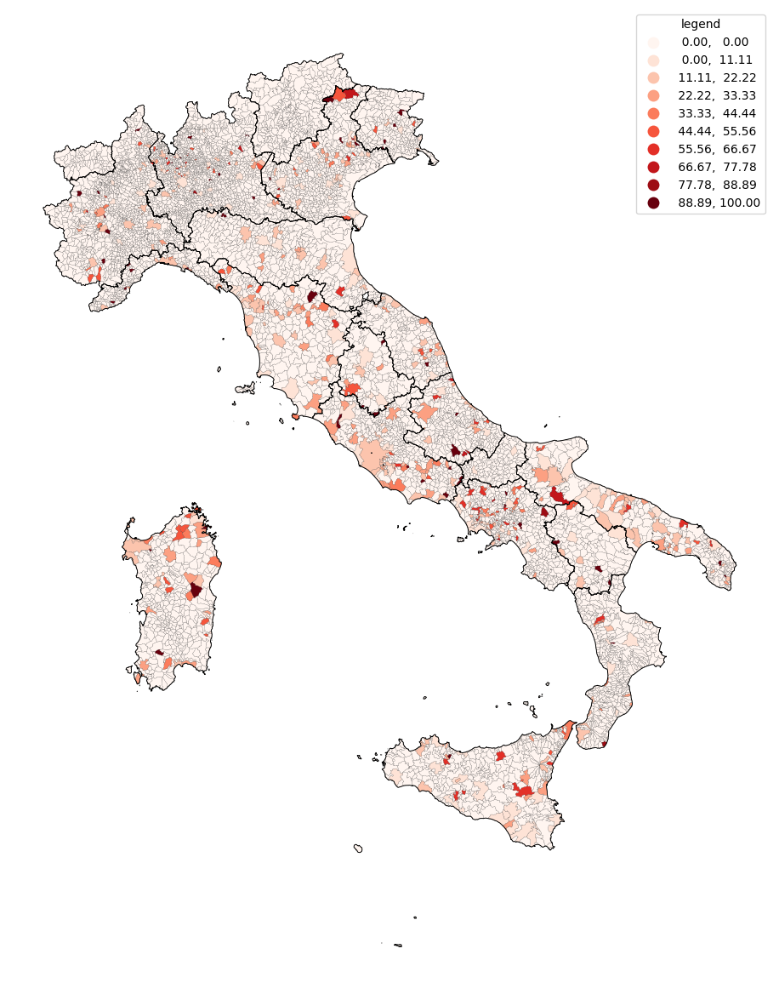

In [48]:
fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.ACQUE.max(), 10)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='TRAFFICO', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

<AxesSubplot: >

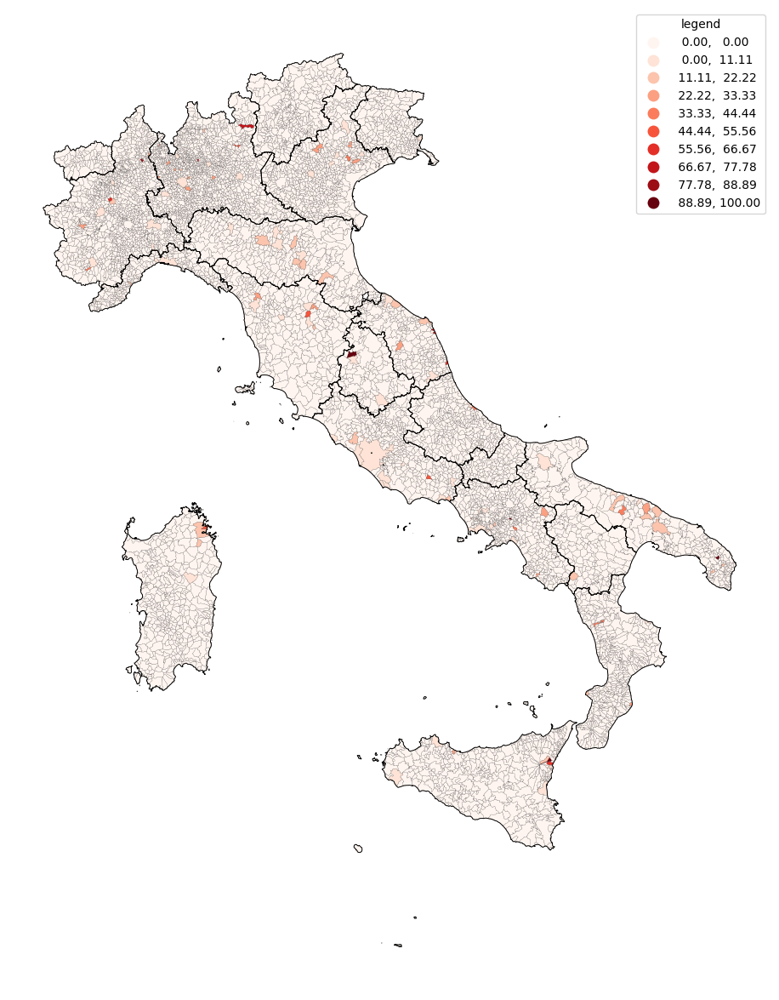

In [49]:
fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.ACQUE.max(), 10)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='TRAFFICOFERROVIARIO', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

<AxesSubplot: >

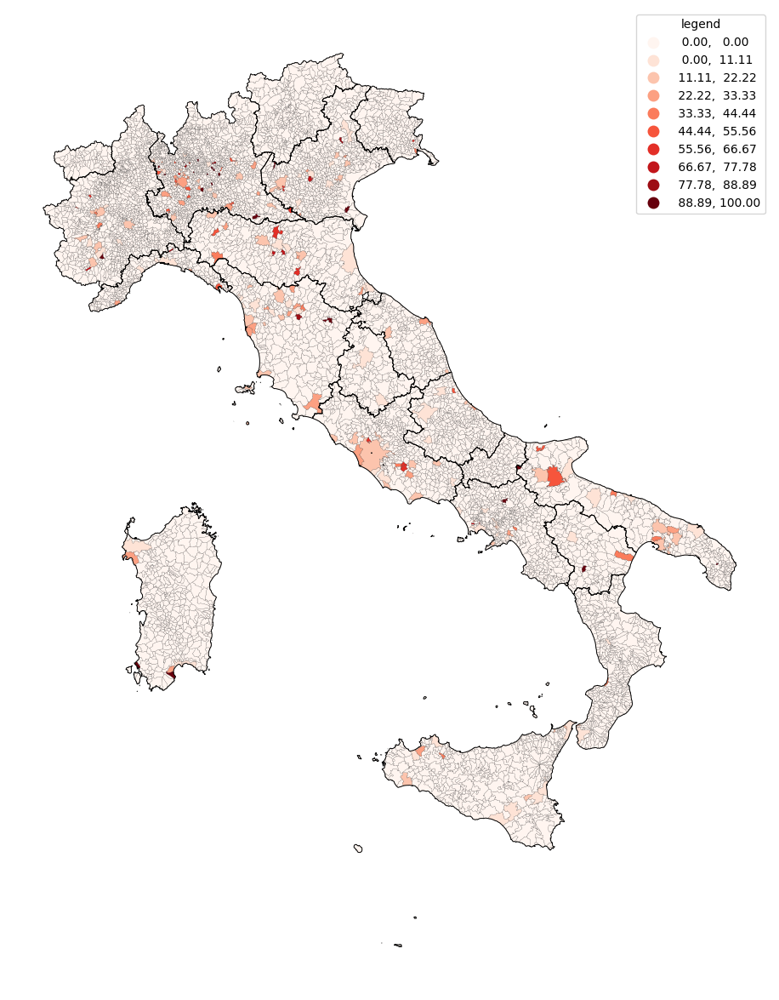

In [50]:
fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.ACQUE.max(), 10)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='ATMOSFERICO', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

<AxesSubplot: >

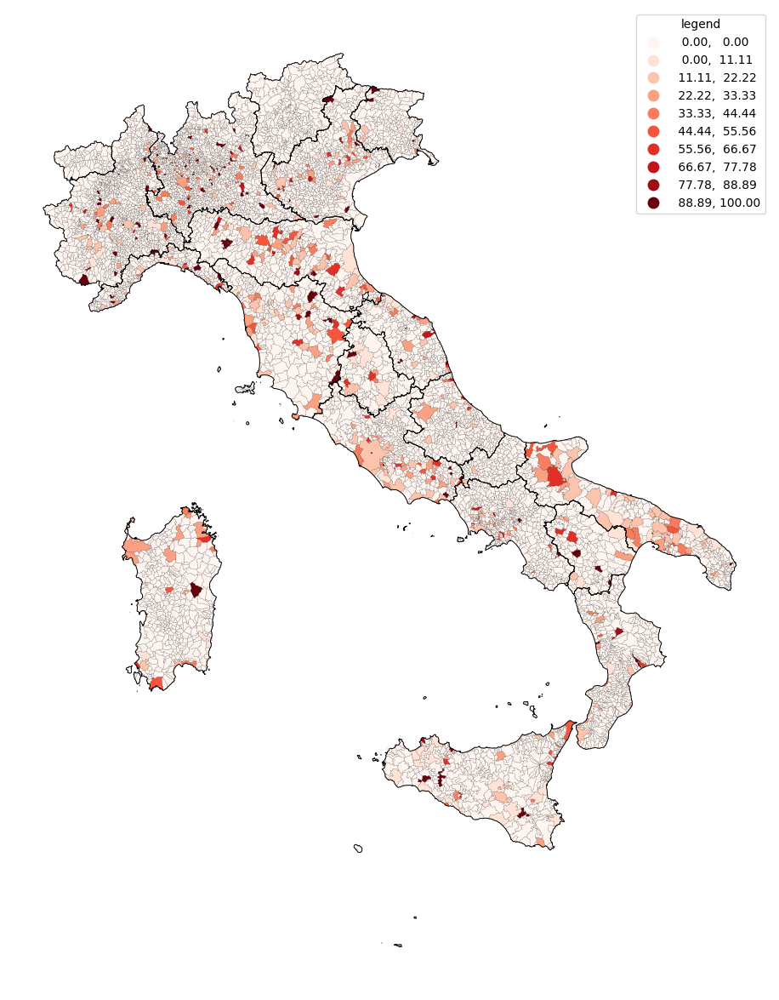

In [51]:
fig, ax = plt.subplots(1, figsize=(15, 15))

ax.set_axis_off()
    
bins = np.linspace(0, comuni.ACQUE.max(), 10)
#cmap = plt.cm.Reds
#cmap.set_under('white')
#comuni.loc[comuni['DISCARICHE'] == 0, 'DISCARICHE'] = -1
    
#plot
comuni.plot(column='ACUSTICO', cmap=plt.cm.Reds, ax=ax, 
        edgecolor='black', linewidth=0.1, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

regioni.geometry.boundary.plot(ax=ax, 
        edgecolor='black', linewidth=0.7, 
)  

In [52]:
elenco_scuole[elenco_scuole.DESCRIZIONECOMUNE == 'LATINA']
elenco_interesse = get_scuole_di_interesse(elenco_scuole)
print(len(a_2122))
print(len(elenco_interesse))
join = pd.merge(elenco_interesse, a_2122, how='outer', on=['CODICESCUOLA'])
join = join.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])
join[join.DESCRIZIONECOMUNE == 'LATINA']
print(len(join))

45446
45446
45446


# Barriere architettoniche

Categorie:
- Accorgimenti presenti in generale ( i dati successivi sono presenti solo se questa è a si )

- accesso esterno con rampe
- Ascensore per il trasporto disabili
- Servoscala piattaforma elevatrice
- servizi igienici per disabili


GRAFICI:
- barchart categorie servizi
- 1: Linechart in cui per ogni servizi indichiamo la percentuale di scuole che lo offrono; così identifichiamo i servizi meno diffusi e quindi critici, e se queste percentuali sono cambiate nel tempo.
- 2: cartina in cui per ogni regione calcoliamo la percentuale di scuole che in generale hanno accorgimenti 
- 3: potremmo fare una cartina per ogni servizio (magari non per tutti, per i principali, tipo accesso con rampe, servo scala o ascensore e servizi igienici) oppure magari una cartina in cui mettiamo la percentuale di scuole che hanno un set "base" (tipo rampe + ascensore o servoscala e servizi) di accorgimenti, e sulla base di quest'ultima scegliamo la regione critica

- pie-chart

REGIONE CRITICA:
- 4: linechart in cui vediamo se la percentuale di scuole che presenta il set base di accorgimenti è variato nel tempo
- 5: cartina a livello provinciale, per vedere se la carenza è localizzata o generale.


Problematicità: come trattiamo i non definiti? li includiamo nel totale? io li includerei come no; è vero che bisognerebbe dare il beneficio del dubbio, ma volendo dichiarare quante scuole, secondo i dati, presentano questi servizi, il non definito mi pare più un no che un si; il motivo per cui è non definito è una problematica relativa alla raccolta dei dati.
Quindi le percentuali le farei SI / SI + NO + NON DEFINITO
Comunque durante la presentazione dovremmo far presente di questa cosa e giustificare la scelta fatta


In [53]:
ba_1718 = get_scuole_di_interesse(ba_1718)
ba_1819 = get_scuole_di_interesse(ba_1819)
ba_2021 = get_scuole_di_interesse(ba_2021)
ba_2122 = get_scuole_di_interesse(ba_2122)

ba_1718 = pd.merge(ba_1718, elenco_scuole, on="CODICESCUOLA")
ba_1718 = ba_1718.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

ba_1819 = pd.merge(ba_1819, elenco_scuole, on="CODICESCUOLA")
ba_1819 = ba_1819.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

ba_2021 = pd.merge(ba_2021, elenco_scuole, on="CODICESCUOLA")
ba_2021 = ba_2021.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

ba_2122 = pd.merge(ba_2122, elenco_scuole, on="CODICESCUOLA")
ba_2122 = ba_2122.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO_x'])

totale_scuole = len(ba_2122)

### Barchart 

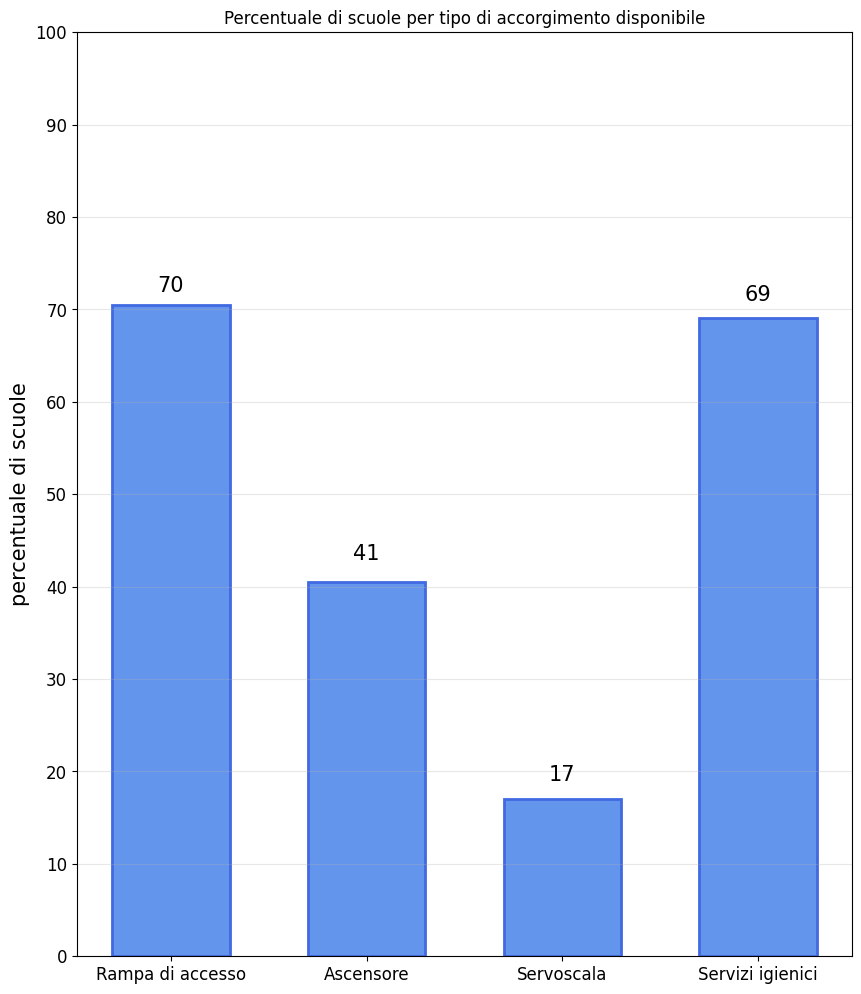

In [54]:
fig, ax = plt.subplots(figsize=(10,12))

plt.ylim([0, 100])

def autolabel(rects):
    for rect in rects:
        height = round(rect.get_height())
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 10),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=15)


labels = ['Rampa di accesso', 'Ascensore', 'Servoscala', 'Servizi igienici']
percentuali = [
    len(ba_2122[ba_2122.ACCESSODAESTERNOCONRAMPE == 'SI']) / totale_scuole * 100,
    len(ba_2122[ba_2122.ASCENSORETRASPORTODISABILI == 'SI']) / totale_scuole * 100,
    len(ba_2122[ba_2122.SERVOSCALAPIATTAFORMAELEVATRICE == 'SI']) / totale_scuole * 100,
    len(ba_2122[ba_2122.SERVIZIIGIENICISPECIFICINORMADISABILI == 'SI']) / totale_scuole * 100
]
#plt.title('Distribuzione mezzi di trasporto per le scuole', fontsize=20)
plt.ylabel("percentuale di scuole", fontsize=15)
plt.yticks(np.arange(0, 105, 10), fontsize=12)
plt.xticks( fontsize = 12)
plt.grid(alpha=0.3, axis='y')
plt.title("Percentuale di scuole per tipo di accorgimento disponibile")

bars = plt.bar(labels, percentuali, 0.6, color='cornflowerblue', edgecolor='royalblue', linewidth=2)
autolabel(bars)



### Piechart

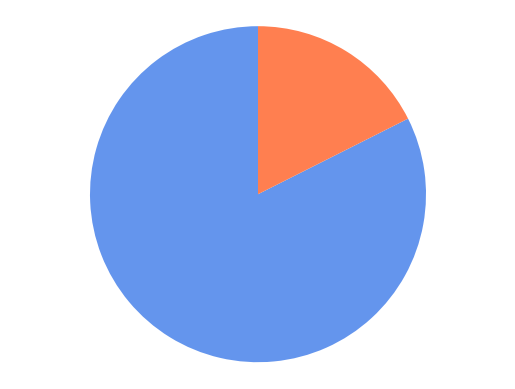

accorgimenti= 82.42529595563965 
no accorgimenti= 17.574704044360345


In [55]:
labels = 'acorgimenti', 'nessun accorgimento'
percentuale = len(ba_2122[ba_2122.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / totale_scuole * 100
sizes = [percentuale, 100-percentuale]

fig1, ax1 = plt.subplots()
ax1.pie(sizes,  startangle=90, colors=["cornflowerblue", "coral"])
#ax1.pie(sizes,  startangle=90, colors=["cornflowerblue", "coral"])
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

print("accorgimenti=", percentuale, "\nno accorgimenti=", 100-percentuale)

### Linechart

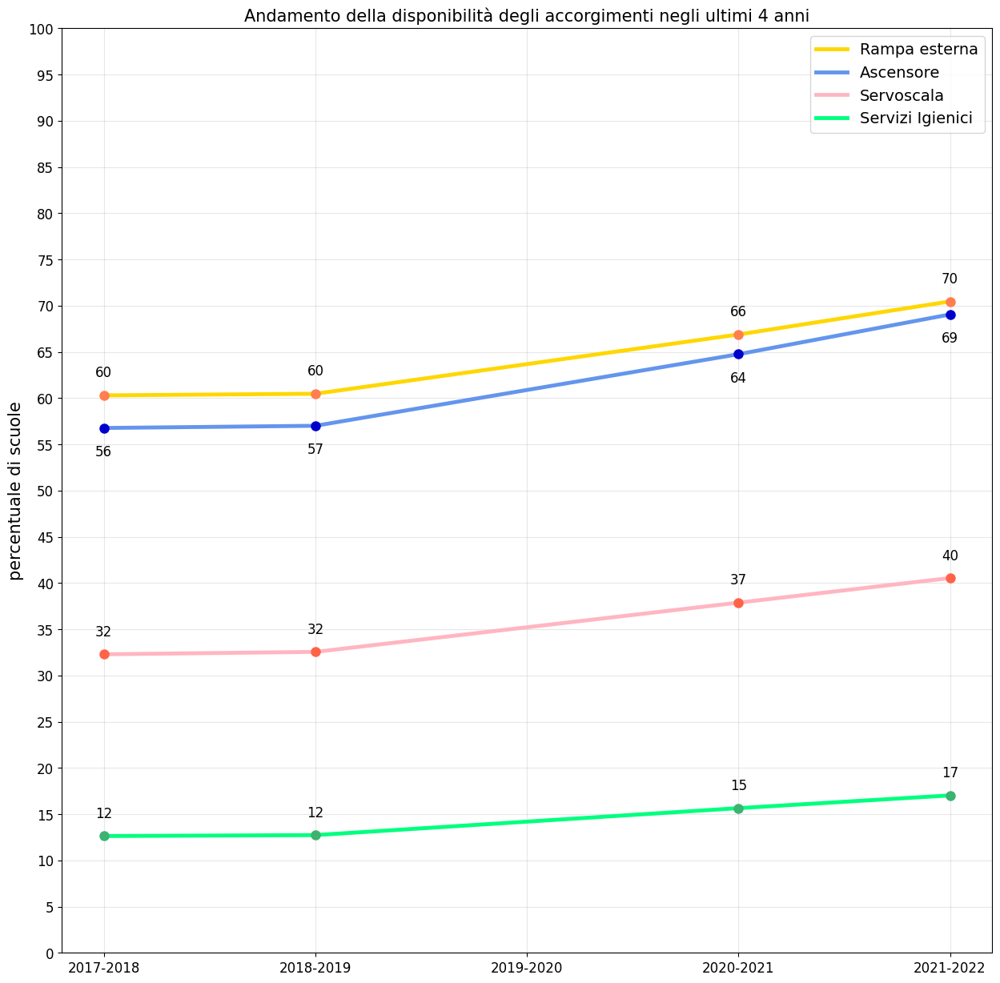

In [56]:
percentuali_1718 = [
    len(ba_1718[ba_1718.ACCESSODAESTERNOCONRAMPE == 'SI']) / len(ba_1718) * 100,
    len(ba_1718[ba_1718.SERVIZIIGIENICISPECIFICINORMADISABILI == 'SI']) / len(ba_1718) * 100,
    len(ba_1718[ba_1718.ASCENSORETRASPORTODISABILI == 'SI']) / len(ba_1718) * 100,
    len(ba_1718[ba_1718.SERVOSCALAPIATTAFORMAELEVATRICE == 'SI']) / len(ba_1718) * 100,
]
percentuali_1819 = [
    len(ba_1819[ba_1819.ACCESSODAESTERNOCONRAMPE == 'SI']) / len(ba_1819) * 100,
    len(ba_1819[ba_1819.SERVIZIIGIENICISPECIFICINORMADISABILI == 'SI']) / len(ba_1819) * 100,
    len(ba_1819[ba_1819.ASCENSORETRASPORTODISABILI == 'SI']) / len(ba_1819) * 100,
    len(ba_1819[ba_1819.SERVOSCALAPIATTAFORMAELEVATRICE == 'SI']) / len(ba_1819) * 100,
]
percentuali_2021 = [
    len(ba_2021[ba_2021.ACCESSODAESTERNOCONRAMPE == 'SI']) / len(ba_2021) * 100,
    len(ba_2021[ba_2021.SERVIZIIGIENICISPECIFICINORMADISABILI == 'SI']) / len(ba_2021) * 100,
    len(ba_2021[ba_2021.ASCENSORETRASPORTODISABILI == 'SI']) / len(ba_2021) * 100,
    len(ba_2021[ba_2021.SERVOSCALAPIATTAFORMAELEVATRICE == 'SI']) / len(ba_2021) * 100,
]
percentuali_2122 = [
    len(ba_2122[ba_2122.ACCESSODAESTERNOCONRAMPE == 'SI']) / len(ba_2122) * 100,
    len(ba_2122[ba_2122.SERVIZIIGIENICISPECIFICINORMADISABILI == 'SI']) / len(ba_2122) * 100,
    len(ba_2122[ba_2122.ASCENSORETRASPORTODISABILI == 'SI']) / len(ba_2122) * 100,
    len(ba_2122[ba_2122.SERVOSCALAPIATTAFORMAELEVATRICE == 'SI']) / len(ba_2122) * 100,
]

labels_fonti = ['Rampa esterna', 
                'Ascensore', 
                'Servoscala', 
                'Servizi Igienici',
]
colors = [
    'gold',
    'cornflowerblue',
    'lightpink',
    'springgreen',
]
color_marker = [
    'coral',
    'mediumblue',
    'tomato',
    'mediumseagreen'
]
labels = ['2017-2018', '2018-2019', '2019-2020', '2020-2021', '2021-2022']

fig, ax = plt.subplots(figsize=(15,15))
plt.ylim([0, 100])
plt.grid(alpha=0.3)
plt.yticks(np.arange(0, 104, 5), fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("percentuale di scuole", fontsize=15)
plt.title("Andamento della disponibilità degli accorgimenti negli ultimi 4 anni", fontsize=15)

for i in range(len(percentuali_1718)):
    lines = [percentuali_1718[i], percentuali_1819[i], (percentuali_2021[i]+percentuali_1819[i])/2, percentuali_2021[i], percentuali_2122[i]]
    dots = [percentuali_1718[i], percentuali_1819[i], None, percentuali_2021[i], percentuali_2122[i]]
    plt.plot(labels, lines, linestyle='-', color=colors[i], linewidth=3.5, label=labels_fonti[i])
    plt.plot(labels, dots, marker='o', color=color_marker[i], linestyle="None", markersize=8)
    
    offset = 2
    if i == 1: offset = -3
    for i, v in enumerate(dots):
        if v == None: continue
        ax.text(i, v + offset, "%d" %v, ha="center", size = 12)
plt.legend(fontsize=14)



## Cartine

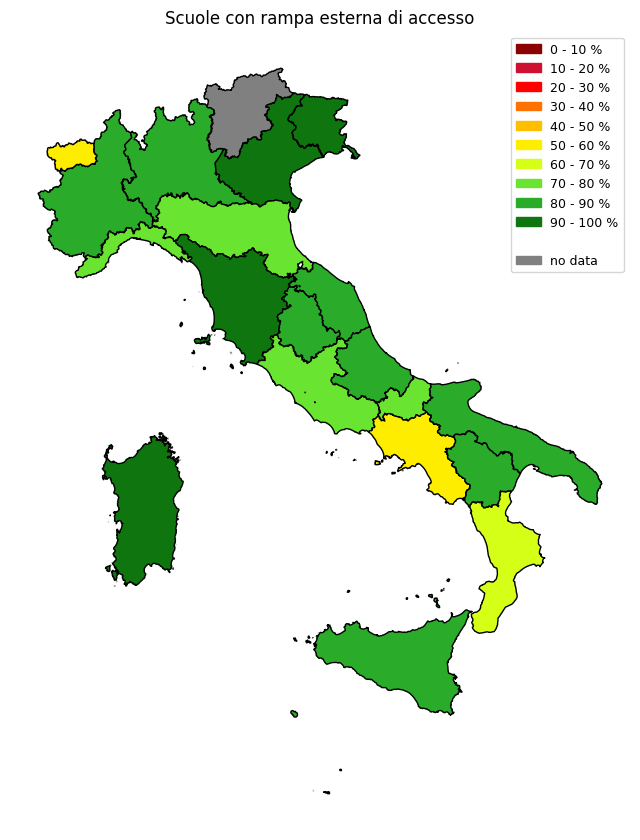

In [57]:
def get_rampe(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        ba_2122, 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_rampe = scuole_regione[scuole_regione.ACCESSODAESTERNOCONRAMPE == 'SI']
    return len(scuole_regione_rampe) / len(scuole_regione) * 100

cartina(get_rampe, cm, 11, shape_regioni, 'Scuole con rampa esterna di accesso')
#cartinaminmax(get_rampe, cm, 8, shape_regioni, 'percentuale scuole con rampe di accesso')

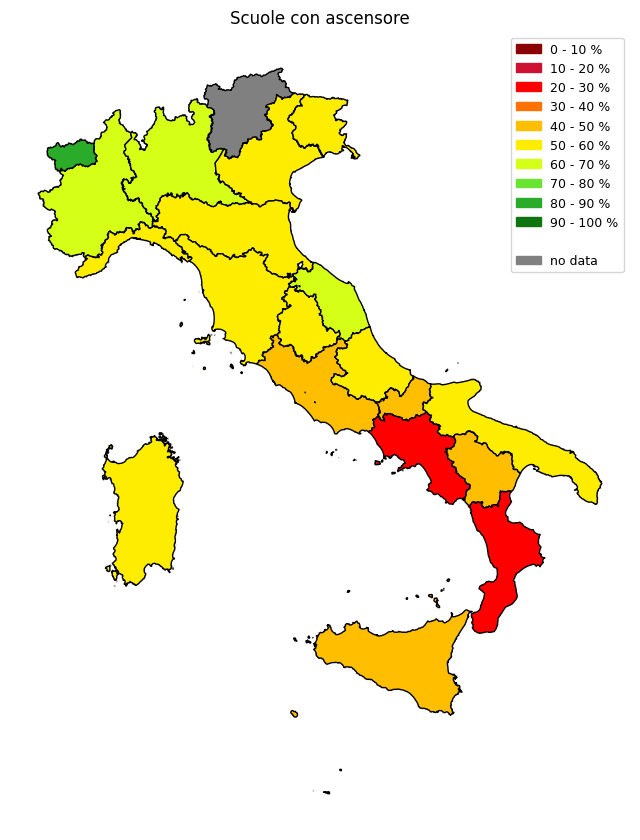

In [58]:
def get_rampe(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        ba_2122, 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_rampe = scuole_regione[scuole_regione.ASCENSORETRASPORTODISABILI == 'SI']
    return len(scuole_regione_rampe) / len(scuole_regione) * 100

cartina(get_rampe, cm, 11, shape_regioni, 'Scuole con ascensore')

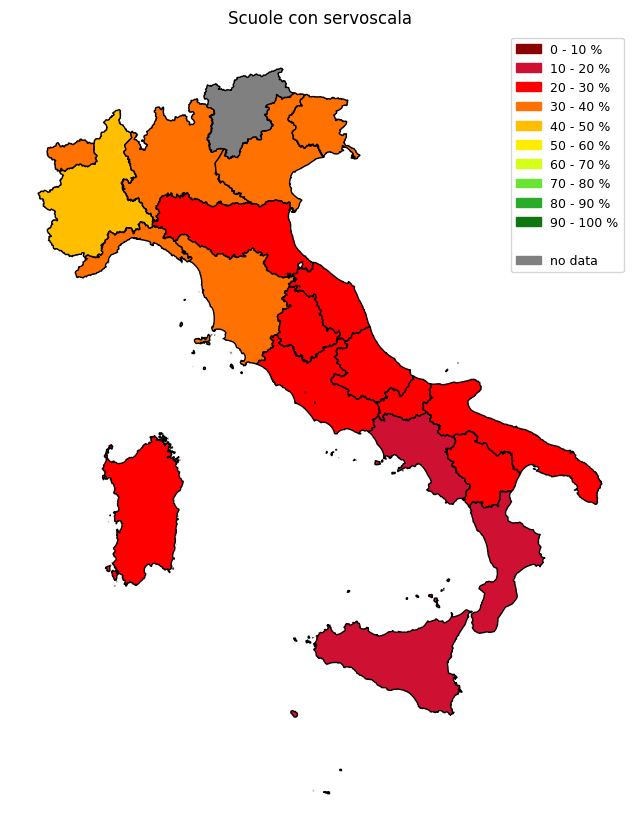

In [59]:
def get_rampe(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        ba_2122, 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_rampe = scuole_regione[scuole_regione.SERVOSCALAPIATTAFORMAELEVATRICE == 'SI']
    return len(scuole_regione_rampe) / len(scuole_regione) * 100

cartina(get_rampe, cm, 11, shape_regioni, 'Scuole con servoscala')

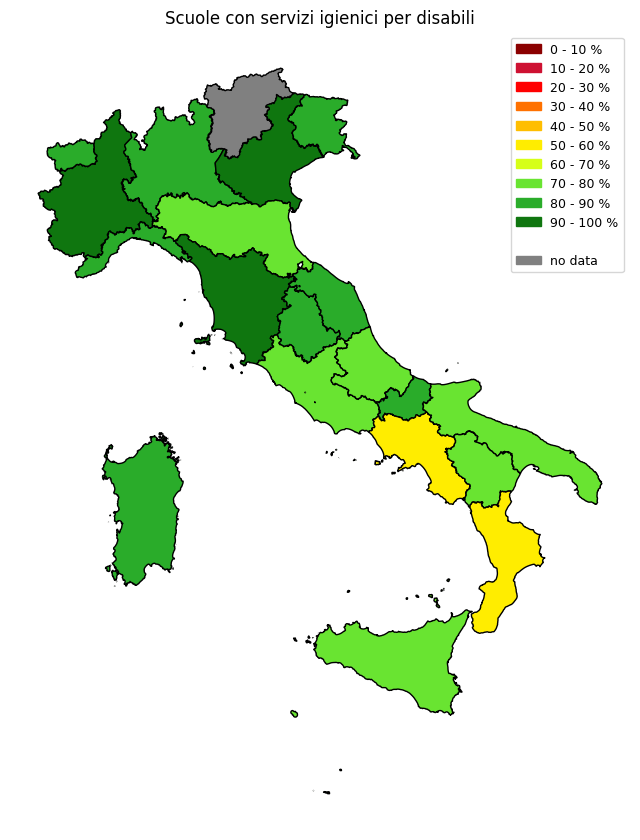

In [60]:
def get_rampe(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        ba_2122, 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_rampe = scuole_regione[scuole_regione.SERVIZIIGIENICISPECIFICINORMADISABILI == 'SI']
    return len(scuole_regione_rampe) / len(scuole_regione) * 100

cartina(get_rampe, cm, 11, shape_regioni, 'Scuole con servizi igienici per disabili')

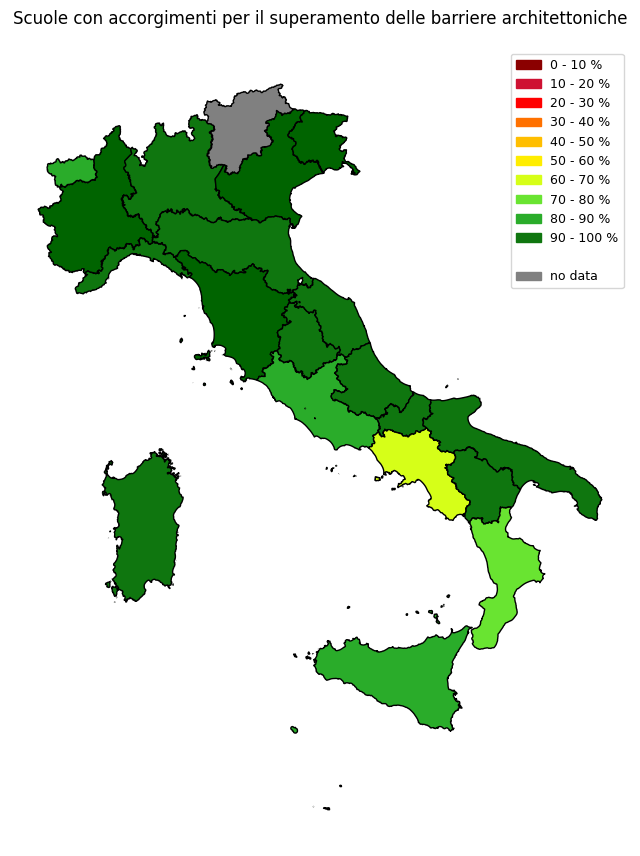

In [61]:
def get_rampe(regione):
    scuole_regione = get_scuole_by_region(
        regione, 
        ba_2122, 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_rampe = scuole_regione[scuole_regione.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']
    return len(scuole_regione_rampe) / len(scuole_regione) * 100

cartina(get_rampe, cm, 11, shape_regioni, 'Scuole con accorgimenti per il superamento delle barriere architettoniche')

### Campania

CAMPANIA:
%2015-16= 52.5734225065426 
%2021-22= 67.32594936708861
+ 14.752526860546013 %

MEDIA ITALIA:
%2015-16= 82.39311865207463 
%2021-22= 89.52394969664262
+ 7.130831044567984 %



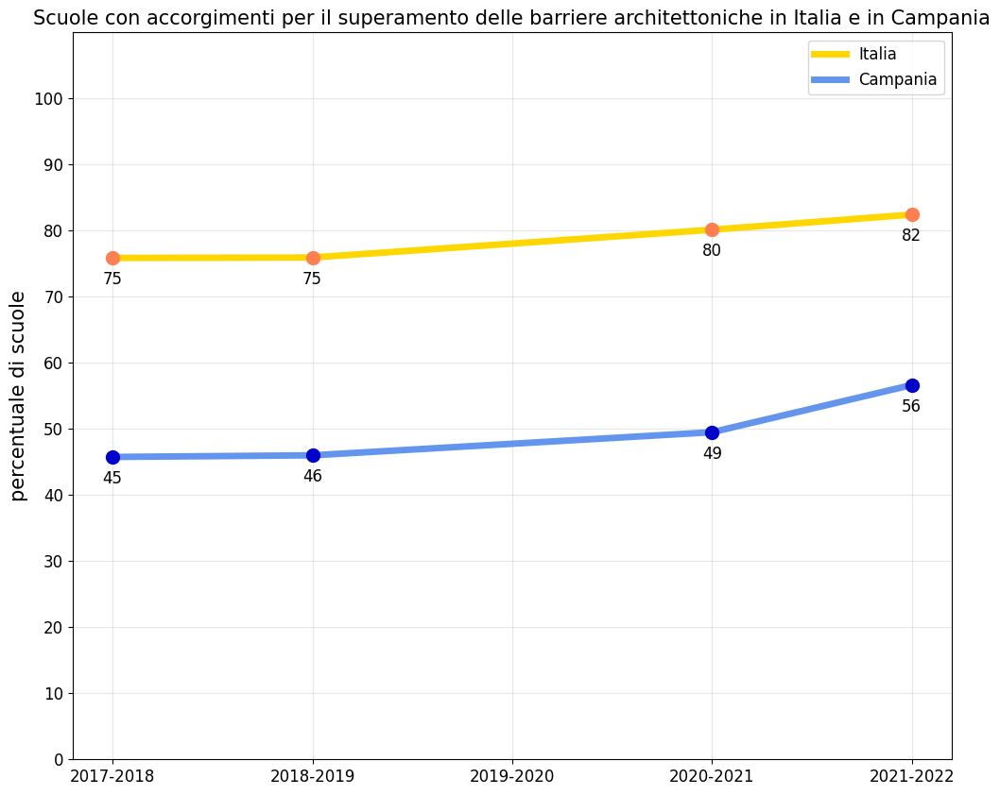

In [62]:
def get_accorgimenti_campania(dataset):
    scuole_regione = get_scuole_by_region(
        'Campania', 
        dataset, 
        elenco_province
    )
    if(len(scuole_regione) == 0): return 0
    scuole_regione_rampe = scuole_regione[scuole_regione.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']
    return len(scuole_regione_rampe) / len(scuole_regione) * 100


italia_line = [
    len(ba_1718[ba_1718.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_1718) * 100,
    len(ba_1819[ba_1819.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_1819) * 100,
    (len(ba_2021[ba_2021.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_2021) * 100 +
    len(ba_1819[ba_1819.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_1819) * 100) / 2,
    len(ba_2021[ba_2021.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_2021) * 100,
    len(ba_2122[ba_2122.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_2122) * 100
]

italia_dots = [
    len(ba_1718[ba_1718.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_1718) * 100,
    len(ba_1819[ba_1819.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_1819) * 100,
    None,
    len(ba_2021[ba_2021.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_2021) * 100,
    len(ba_2122[ba_2122.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(ba_2122) * 100
]

campania_line = [
    get_accorgimenti_campania(ba_1718),
    get_accorgimenti_campania(ba_1819),
    (get_accorgimenti_campania(ba_2021) + get_accorgimenti_campania(ba_1819)) / 2,
    get_accorgimenti_campania(ba_2021),
    get_accorgimenti_campania(ba_2122)
]

campania_dots = [
    get_accorgimenti_campania(ba_1718),
    get_accorgimenti_campania(ba_1819),
    None,
    get_accorgimenti_campania(ba_2021),
    get_accorgimenti_campania(ba_2122)
]

years_labels = ['2017-2018', '2018-2019', '2019-2020', '2020-2021', '2021-2022'] 


fig, ax = plt.subplots(figsize=(12,10))
plt.ylim([0, 100])

#media
plt.plot(years_labels, italia_line, linestyle='-', color='gold', linewidth=5, label='Italia')
plt.plot(years_labels, italia_dots, marker='o', color='coral', linestyle="None", markersize=10)

for i, v in enumerate(italia_dots):
    if v == None: continue
    ax.text(i, v -4, "%d" %v, ha="center", size = 12)

#campania
plt.plot(years_labels, campania_line, linestyle='-', color='cornflowerblue', linewidth=5, label='Campania')
plt.plot(years_labels, campania_dots, marker='o', color='mediumblue', linestyle="None", markersize=10)
plt.grid(alpha=0.3)
plt.yticks(np.arange(0, 105, 10), fontsize=12)
plt.ylim([0, 110])
plt.xticks(fontsize=12)
plt.ylabel("percentuale di scuole", fontsize=15)
plt.legend(fontsize=12)
plt.title("Scuole con accorgimenti per il superamento delle barriere architettoniche in Italia e in Campania", fontsize=15)

for i, v in enumerate(campania_dots):
    if v == None: continue
    ax.text(i, v - 4, "%d" %v, ha="center", size = 12)

print("CAMPANIA:\n%2015-16=", campania_1516, "\n%2021-22=", campania_2122)
print("+", campania_2122 - campania_1516, "%\n" )

print("MEDIA ITALIA:\n%2015-16=", percentuale_1516, "\n%2021-22=", percentuale_2122)
print("+", percentuale_2122 - percentuale_1516, "%\n" )

### Cartina dei comuni della campagna (accorgimenti si-no)

In [63]:
print(ba_2122.columns)

Index(['ANNOSCOLASTICO_x', 'CODICESCUOLA', 'CODICEEDIFICIO_x',
       'ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE',
       'ACCESSODAESTERNOCONRAMPE', 'SCALEANORMA', 'ASCENSORETRASPORTODISABILI',
       'SERVOSCALAPIATTAFORMAELEVATRICE',
       'SERVIZIIGIENICISPECIFICINORMADISABILI', 'PORTELARGHEZZAMINIMA',
       'PERCORSIINTERNI', 'PERCORSIESTERNI', 'ANNOSCOLASTICO_y',
       'CODICEEDIFICIO_y', 'CODICECOMUNE', 'DESCRIZIONECOMUNE',
       'SIGLAPROVINCIA', 'TIPOLOGIAINDIRIZZO', 'DENOMINAZIONEINDIRIZZO',
       'NUMEROCIVICO', 'CAP'],
      dtype='object')


/opt/anaconda3/lib/python3.8/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<AxesSubplot: title={'center': 'Scuole della Campania con accorgimenti per il superamento delle barriere architettoniche'}>

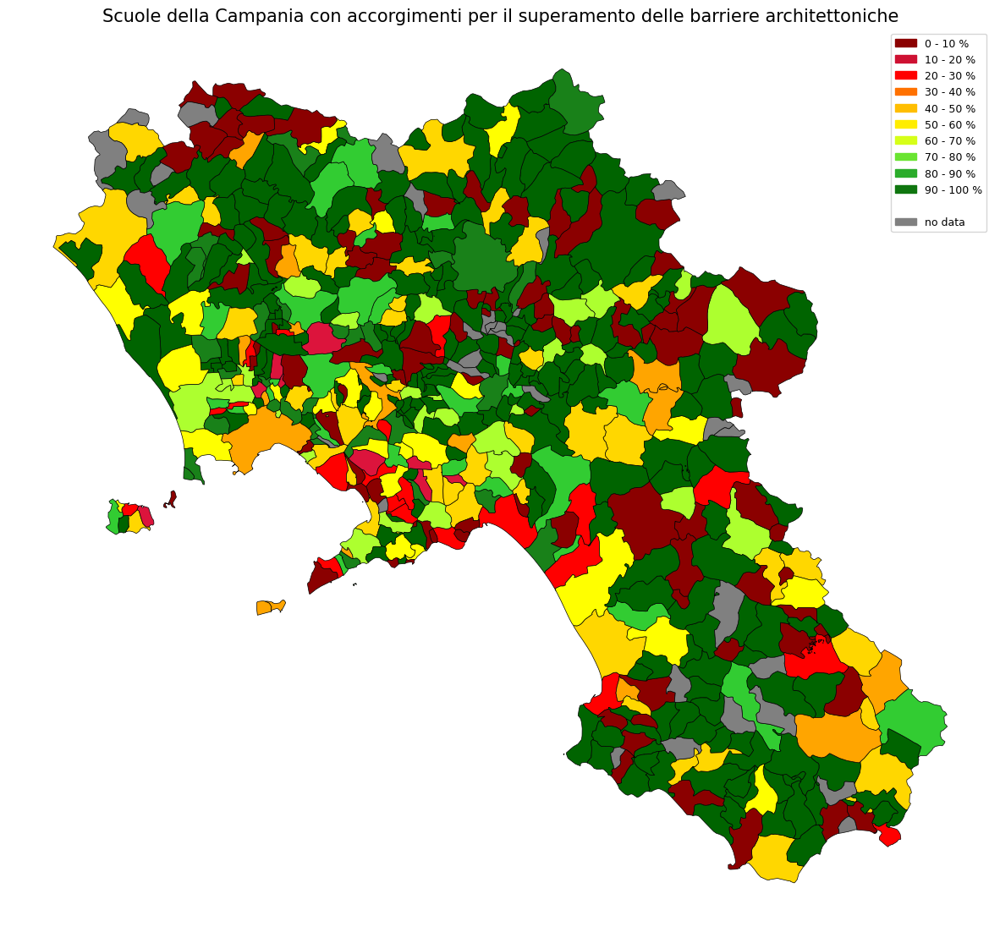

In [73]:
comuni_campania = comuni[comuni.COD_REG == 15]


def get_percentuale_accorgimenti_per_comune(comune):
    elenco_scuole_comune = ba_2122[ba_2122.DESCRIZIONECOMUNE == comune]
    if len(elenco_scuole_comune) == 0: return -1
    return len(elenco_scuole_comune[elenco_scuole_comune.ACCORGIMENTISUPERAMENTOBARRIEREARCHITETTONICHE == 'SI']) / len(elenco_scuole_comune) * 100
    
    

comuni_campania['ACCORGIMENTI'] = comuni_campania.COMUNE.apply(lambda x: get_percentuale_accorgimenti_per_comune(x))

nodata = comuni_campania[comuni_campania.ACCORGIMENTI == -1]
comuni_campania = comuni_campania.drop(comuni_campania[comuni_campania.ACCORGIMENTI == -1].index)

fig, ax = plt.subplots(1, figsize=(15, 15))
ax.set_axis_off()
bins = np.linspace(10, 100, 10)
bins_size = 10
    
#plot
comuni_campania.plot(column = 'ACCORGIMENTI', cmap=cm, ax=ax, 
        edgecolor='black', linewidth=0.5, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

sm = plt.cm.ScalarMappable(cmap=cm, norm=plt.Normalize(vmin=0, vmax=100))
    
patches = []
patches.append(
        mpatches.Patch(
            color=sm.to_rgba(0), 
            label=(
                str(round(0)) + ' - ' + str(round(10)) + " %"
            )
        )
    )
for i in range(bins_size - 1):
    patches.append(
        mpatches.Patch(
            color=sm.to_rgba(bins[i]), 
            label=(
                str(round(bins[i])) + ' - ' + str(round(bins[i + 1])) + " %"
            )
        )
    )

patches.append(mpatches.Patch(color='none'))
patches.append(mpatches.Patch(color='gray', label='no data'))
ax.legend(handles=patches, loc="best", prop={'size':9})
plt.title("Scuole della Campania con accorgimenti per il superamento delle barriere architettoniche", fontsize=15)

nodata.plot(color='gray', ax=ax, edgecolor='black', linewidth=0.5)

### Cartina 1 mezzo campania

In [65]:
t_2122_merged = pd.merge(t_2122, elenco_scuole, on="CODICESCUOLA", suffixes=('', '_y'))
t_2122_merged.drop(t_2122_merged.filter(regex='_y$').columns, axis=1, inplace=True)
t_2122_merged.drop_duplicates(subset=['CODICESCUOLA', 'CODICEEDIFICIO'])

,ANNOSCOLASTICO,CODICESCUOLA,CODICEEDIFICIO,SCUOLABUS,TRASPORTIPUBBLICIURBANI,TRASPORTIPUBBLICIINTERURBANI,TRASPORTIFERROVIARI,MEZZIPRIVATI,TRASPORTODISABILI,PISTACICLABILE,CODICECOMUNE,DESCRIZIONECOMUNE,SIGLAPROVINCIA,TIPOLOGIAINDIRIZZO,DENOMINAZIONEINDIRIZZO,NUMEROCIVICO,CAP
0,202122,NAMM297002,630341638,NO,NO,NO,NO,NO,NO,NON DEFINITO,63034,GIUGLIANO IN CAMPANIA,NaN,Via,Signorelli a Patria,9/A,80014
4,202122,NAMM297002,630341621,SI,NO,NO,NO,SI,SI,NON DEFINITO,63034,GIUGLIANO IN CAMPANIA,NaN,Via,Signorelli a Patria,9/A,80014
8,202122,NAMM297002,630341622,SI,NO,NO,NO,SI,SI,NO,63034,GIUGLIANO IN CAMPANIA,NaN,Via,Signorelli a Patria,9/A,80014
12,202122,NAMM297002,630341635,SI,SI,SI,NO,SI,SI,NO,63034,GIUGLIANO IN CAMPANIA,NaN,Via,Signorelli a Patria,9/A,80014
16,202122,LTEE800031,590050201,NO,SI,NO,NO,NO,SI,NON DEFINITO,59005,CISTERNA DI LATINA,LT,Via,VITTIME DEL TERRORISMO,31,04012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97142,202122,CTAA814014,870032485,NO,NO,SI,NO,SI,NO,NON DEFINITO,87003,ACI CATENA,CT,Via,S. ANTONIO (fraz. San Nicolò),3,95022
97143,202122,NAIC8CU004,630490037,SI,SI,SI,NO,SI,SI,NO,63049,NAPOLI,NaN,Corso,DUCA D`AOSTA,78,80126
97144,202122,NAIC8B900L,630491418,SI,SI,SI,NO,SI,SI,NON DEFINITO,63049,NAPOLI,NaN,Viale,Delle Galassie,2,80144
97145,202122,VAAA863019,121340061,SI,SI,NO,NO,SI,SI,SI,12134,VEDANO OLONA,VA,Via,ROMA,34,21040


/opt/anaconda3/lib/python3.8/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


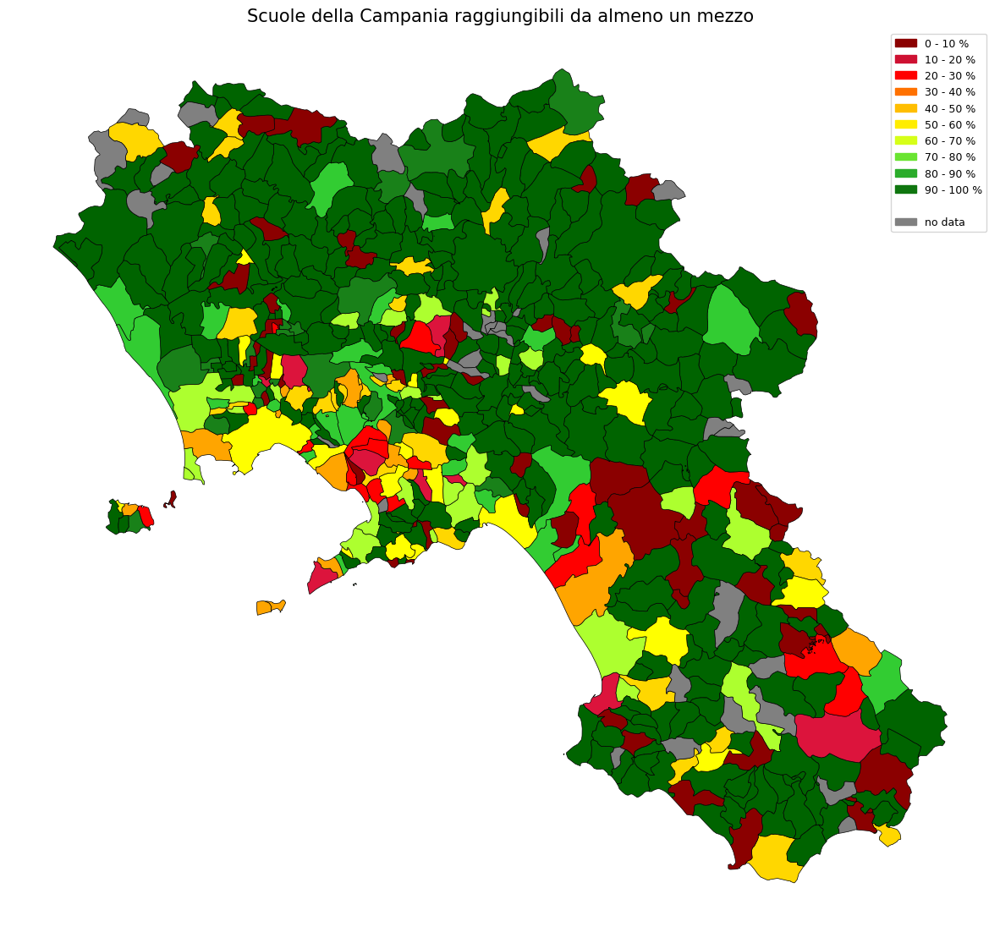

In [70]:
comuni_campania = comuni[comuni.COD_REG == 15]

def get_percentuale_1mezzo(comune):
    elenco_scuole_comune = get_scuole_di_interesse(t_2122_merged[t_2122_merged.DESCRIZIONECOMUNE == comune])
    if len(elenco_scuole_comune) == 0: return -1
    elenco_scuole_comune_1mezzo = get_scuole_1mezzo(elenco_scuole_comune)
    return len(elenco_scuole_comune_1mezzo) / len(elenco_scuole_comune) * 100
    
    

comuni_campania['1MEZZO'] = comuni_campania.COMUNE.apply(lambda x: get_percentuale_1mezzo(x))

nodata = comuni_campania[comuni_campania['1MEZZO'] == -1]
comuni_campania = comuni_campania.drop(comuni_campania[comuni_campania['1MEZZO'] == -1].index)

fig, ax = plt.subplots(1, figsize=(15, 15))
ax.set_axis_off()
bins = np.linspace(10, 100, 10)
bins_size = 10
    
#plot
comuni_campania.plot(column = '1MEZZO', cmap=cm, ax=ax, 
        edgecolor='black', linewidth=0.5, 
        scheme="User_Defined", 
        classification_kwds=dict(bins=bins),
        legend=True, legend_kwds={'title': "legend"}
)

sm = plt.cm.ScalarMappable(cmap=cm, norm=plt.Normalize(vmin=0, vmax=100))
    
patches = []
patches.append(
        mpatches.Patch(
            color=sm.to_rgba(0), 
            label=(
                str(round(0)) + ' - ' + str(round(10)) + " %"
            )
        )
    )
for i in range(bins_size - 1):
    patches.append(
        mpatches.Patch(
            color=sm.to_rgba(bins[i]), 
            label=(
                str(round(bins[i])) + ' - ' + str(round(bins[i + 1])) + " %"
            )
        )
    )

patches.append(mpatches.Patch(color='none'))
patches.append(mpatches.Patch(color='gray', label='no data'))
ax.legend(handles=patches, loc="best", prop={'size':9}, fontsize=20)
plt.title("Scuole della Campania raggiungibili da almeno un mezzo", fontsize=15)

nodata.plot(color='gray', ax=ax, edgecolor='black', linewidth=0.5)

plt.savefig("campania1mezzo.png")